<a href="https://colab.research.google.com/github/Floquicanale/TP-2-PSB/blob/main/PSB2023Q1_TP2_Ejercicio_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Trabajo Práctico 2, Ejercicio 3: PE

##1 - Librerías

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install brainflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.6/28.6 MB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.1/45.1 kB 4.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import scipy.signal as signal
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import scipy.io
import math
from scipy.fft import fft
import librosa
from sklearn.preprocessing import normalize
from brainflow.board_shim import BoardShim, BrainFlowInputParams, BoardIds
from brainflow.data_filter import DataFilter, NoiseTypes, FilterTypes

##2 - Carga de archivos y extracción de información

Para este informe se tuvieron en cuenta cinco* archivos de datos obtenidos de dos pacientes a través de una interfaz Cyton de OpenBCI. Ambos pacientes fueron sometidos a dos estudios distintos de potenciales evocados visuales: cambio de patrón (un tablero de ajedrez) y flash. El paciente 1 fue evaluado con dos tableros de ajedrez distintos, uno convencional y otro con cuadros rojos y verdes.

*
Un archivo quedó fuera del presente análisis debido a que su formato era distinto al resto y para procesarlo era necesario escribir un código aparte.

###**Tablero de ajedrez**

Se importan los archivos de ajedrez a ser procesados:

In [ ]:
arch_path1 = '/content/drive/MyDrive/Colab Notebooks/Archivos PE/A_A_G2.csv'
datos1 = pd.read_csv(arch_path1, sep='\t')

arch_path2 = '/content/drive/MyDrive/Colab Notebooks/Archivos PE/J_A_G5.csv'
datos2 = pd.read_csv(arch_path2, sep='\t')

arch_path3 = '/content/drive/MyDrive/Colab Notebooks/Archivos PE/A_RV_G2.csv'
datos3 = pd.read_csv(arch_path3, sep='\t')

header = [f"Columna{i}" for i in range(1, 25)]

for i in range(4):
  if i != 0:
   vars()['datos' + str(i)].columns = header

print('Data From the File')
print(datos1.head())
print(datos1.tail())

Data From the File
   Columna1  Columna2      Columna3       Columna4     Columna5  \
0       1.0  187500.0  30182.096980 -187500.022352  3126.249090   
1       2.0  187500.0  30193.317556 -187500.022352  3127.031401   
2       3.0  187500.0  30196.625614 -187500.022352  3131.412343   
3       4.0  187500.0  30189.517759 -187500.022352  3129.646555   
4       5.0  187500.0  30190.188311 -187500.022352  3123.522177   

        Columna6      Columna7  Columna8      Columna9  Columna10  ...  \
0 -137728.498903  13648.556310  187500.0  15661.330898      0.012  ...   
1 -137738.892465  13656.893510  187500.0  15667.812904      0.012  ...   
2 -137757.176191  13659.732182  187500.0  15673.289081      0.012  ...   
3 -137742.356985  13654.323060  187500.0  15676.328918      0.012  ...   
4 -137734.913854  13650.500912  187500.0  15669.936320      0.012  ...   

   Columna15  Columna16  Columna17  Columna18  Columna19  Columna20  \
0       96.0      254.0      240.0       31.0       64.0      

A continuación, se transforman los archivos a numpy array y  se obtiene el tiempo de toma de datos de cada archivo. También se generan vectores para la cantidad de canales de cada archivo y vectores de tiempo que servirán para la visualización y el procesamiento de las señales.

In [ ]:
data1 = datos1.to_numpy()
data2 = datos2.to_numpy()
data3 = datos3.to_numpy()

In [ ]:
fs = 250
a1 = data1.shape[0]
a2 = data2.shape[0]
a3 = data3.shape[0]

In [ ]:
print(f"Se registraron", a1/fs ,"segundos en la muestra 1")
print(f"Se registraron", a2/fs ,"segundos en la muestra 2")
print(f"Se registraron", a3/fs ,"segundos en la muestra 3")

Se registraron 210.184 segundos en la muestra 1
Se registraron 126.012 segundos en la muestra 2
Se registraron 68.312 segundos en la muestra 3


In [ ]:
#Se define la cantidad de canales (todos los archivos de ajedrez menos data4 tienen esta cantidad)
cant_canales = data1.shape[1]
canales = np.arange(0,cant_canales)+1
canales

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])

In [ ]:
tiempo1 = np.linspace(0,a1,a1)
tiempo2 = np.linspace(0,a2,a2)
tiempo3 = np.linspace(0,a3,a3)

La siguiente función permite observar gráficamente los canales para un archivo de datos en particular (de los primeros 3).

In [ ]:
def canales_graf(datos,tiempo):

  for c in canales:
    if c not in [3,5,7,9]:
      continue
    if c == 3:
      titulo = 'Canal '+ str(c-1) +': EOG derecho'
    if c == 5:
      titulo = 'Canal '+ str(c-1) +': EOG izquierdo'
    if c == 7:
      titulo = 'Canal '+ str(c-1) +': Fz'
    if c == 9:
      titulo = 'Canal '+ str(c-1) +': Oz'

    plt.figure(figsize=(20,4))
    plt.title(titulo)
    plt.plot(tiempo[1:], datos[f"Columna{c}"][1:])
    plt.show()


Se grafican los canales correspondientes a los pacientes que observaron el tablero de ajedrez convencional.

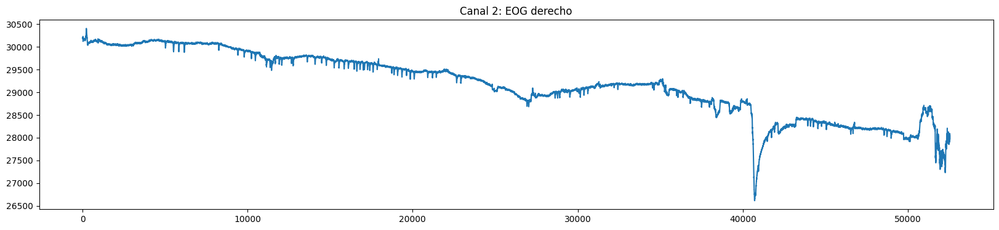

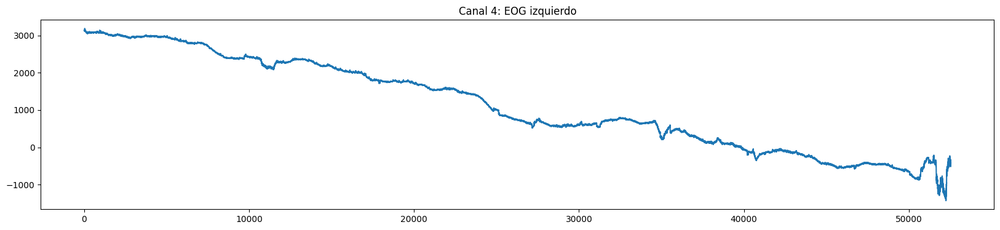

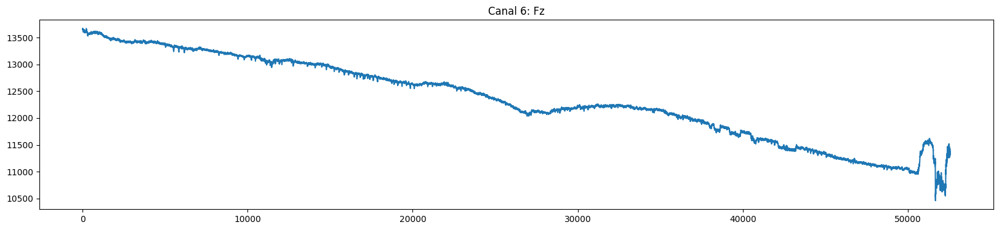

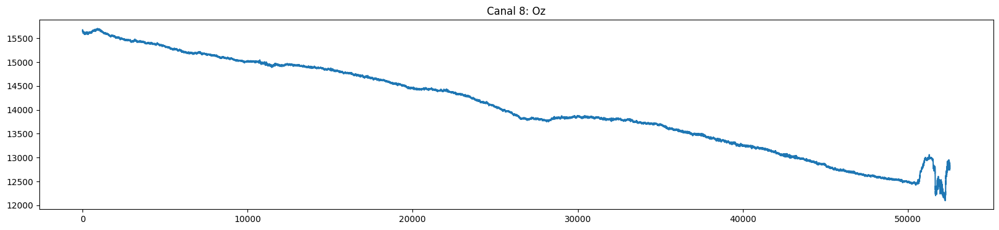

In [ ]:
canales_graf(datos1,tiempo1)

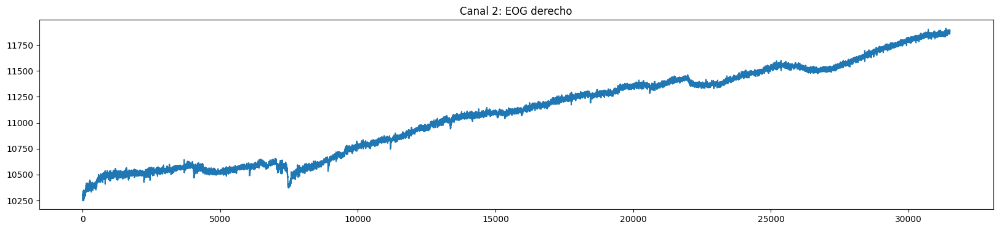

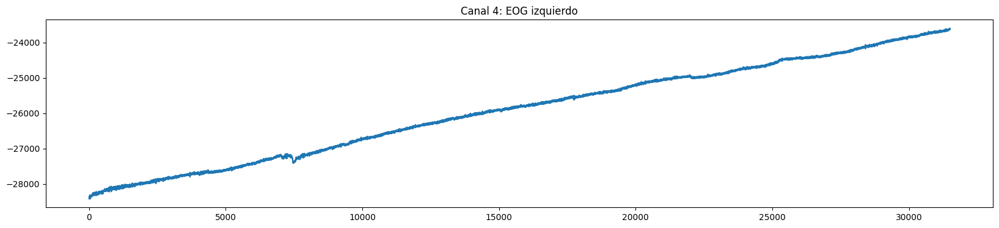

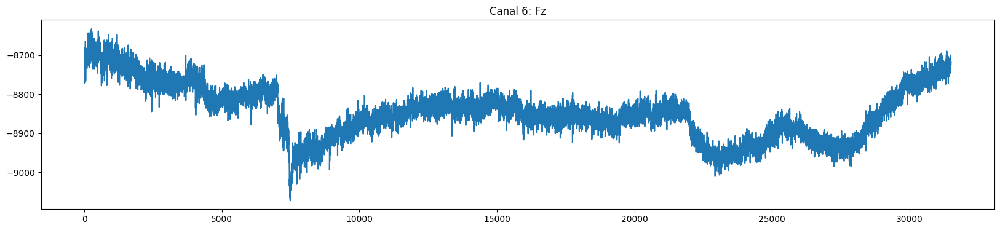

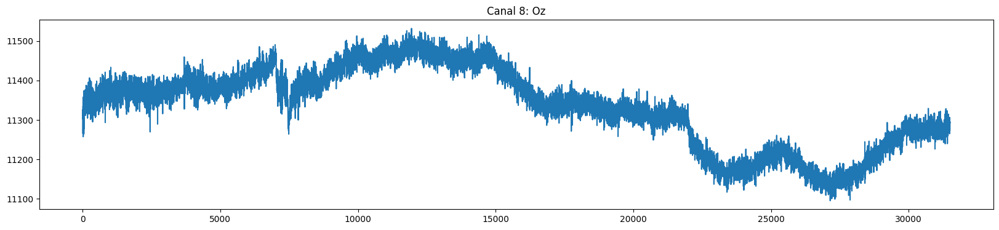

In [ ]:
canales_graf(datos2,tiempo2)

Finalmente, se grafican los canales del paciente que observó el tablero de ajedrez rojo y verde.

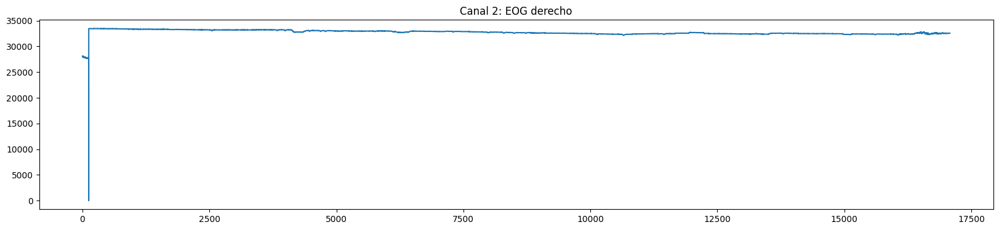

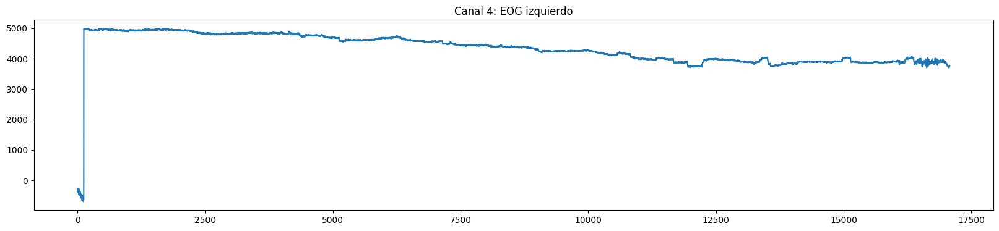

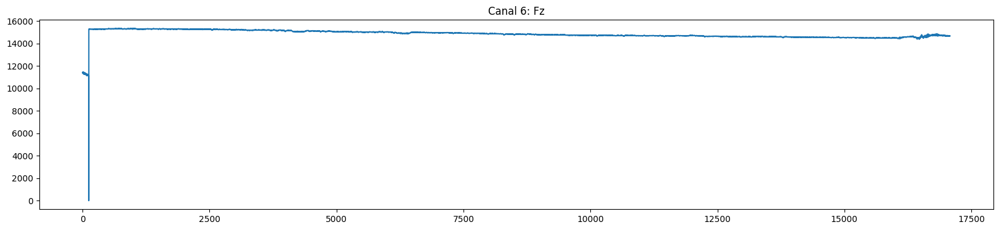

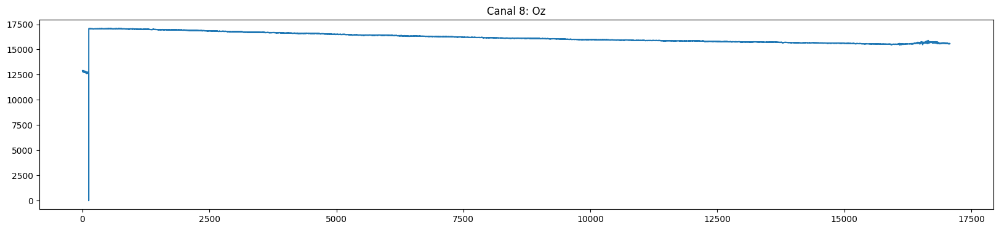

In [ ]:
canales_graf(datos3,tiempo3)

Se puede observar que en este último sujeto hay un ruido en las primeras muestras que esconde la verdadera naturaleza de la señal. Por lo tanto, se extraen las primeras 1000 muestras de la señal (2 segundos) para trabajar. El procedimiento se le aplicó a todos los sujetos con el motivo de homogeneizar el método de análisis y trabajar con el mismo código para todos. A continuación se puede ver que, extrayendo estos primeros datos para el paciente mencionado, la señal es mucho más parecida a las demás.

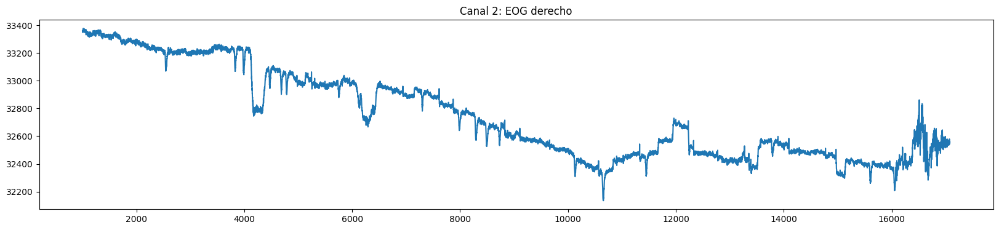

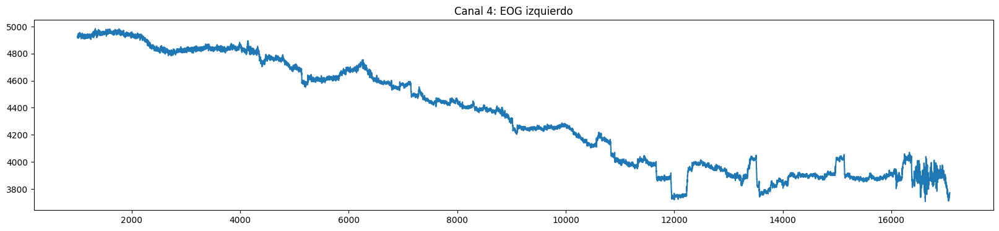

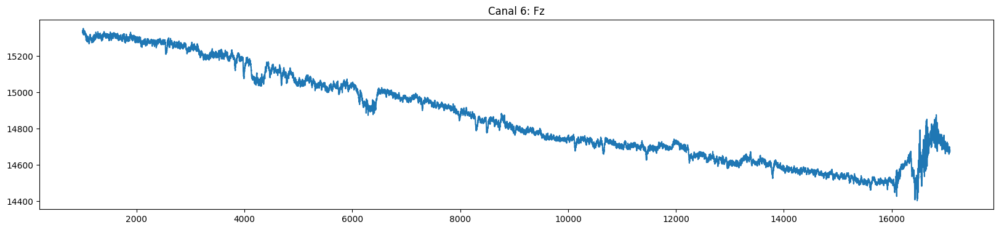

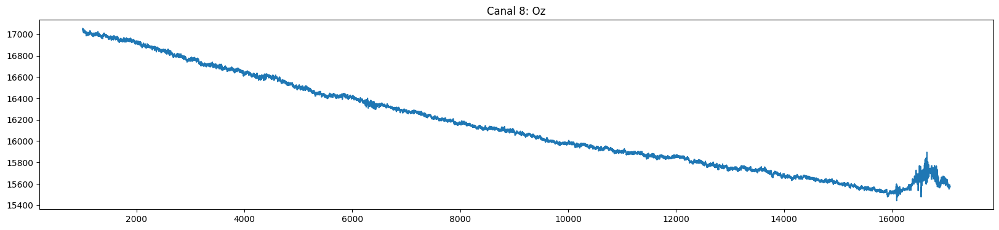

In [ ]:
canales_graf(datos3[1000:],tiempo3[1000:])

###**Flash**

Se importan los dos archivos correspondientes a flash

El tratamiento de estos sets de datos es análogo al de los tableros de ajedrez

In [ ]:
flash_path1 = '/content/drive/MyDrive/Colab Notebooks/Archivos PE/A_F_G6.csv'
flash1 = pd.read_csv(flash_path1, sep='\t')

flash_path2 = '/content/drive/MyDrive/Colab Notebooks/Archivos PE/J_F_G5.csv'
flash2 = pd.read_csv(flash_path2, sep='\t')

header = [f"Columna{i}" for i in range(1, 25)]

for i in range(3):
  if i != 0:
   vars()['flash' + str(i)].columns = header

print('Data From the File')
print(flash1.head())
print(flash2.tail())

Data From the File
   Columna1  Columna2      Columna3       Columna4     Columna5  \
0       1.0  187500.0  25925.319007 -187500.022352 -5270.787212   
1       2.0  187500.0  25934.192650 -187500.022352 -5265.534552   
2       3.0  187500.0  25938.215964 -187500.022352 -5275.905761   
3       4.0  187500.0  25945.703798 -187500.022352 -5275.816354   
4       5.0  187500.0  25957.080836 -187500.022352 -5272.530648   

        Columna6     Columna7  Columna8     Columna9  Columna10  ...  \
0 -187500.022352  7291.675483  187500.0  8050.628966       0.02  ...   
1 -187500.022352  7289.485012  187500.0  8042.671745       0.02  ...   
2 -187500.022352  7290.267323  187500.0  8041.107123       0.02  ...   
3 -187500.022352  7291.787242  187500.0  8041.218882       0.02  ...   
4 -187500.022352  7293.240105  187500.0  8039.564853       0.02  ...   

   Columna15  Columna16  Columna17  Columna18  Columna19  Columna20  \
0        0.0        0.0        0.0        0.0        0.0        0.0   
1  

In [ ]:
dataf1 = flash1.to_numpy()
dataf2 = flash2.to_numpy()

In [ ]:
fs = 250
f1 = dataf1.shape[0]
f2 = dataf2.shape[0]

In [ ]:
print(f"Se registraron", f1/fs ,"segundos en la muestra 1")
print(f"Se registraron", f2/fs ,"segundos en la muestra 2")

Se registraron 215.0 segundos en la muestra 1
Se registraron 251.068 segundos en la muestra 2


In [ ]:
tiempof1 = np.linspace(0,f1,f1)
tiempof2 = np.linspace(0,f2,f2)

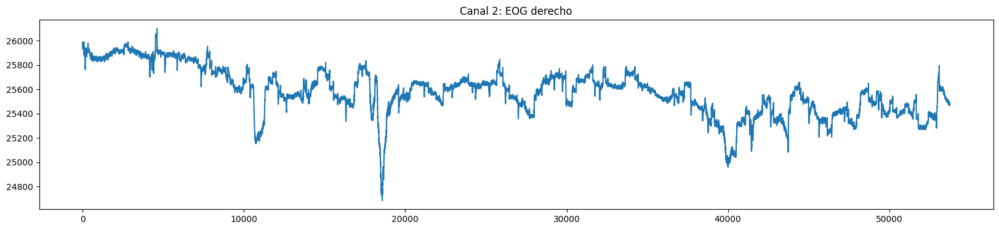

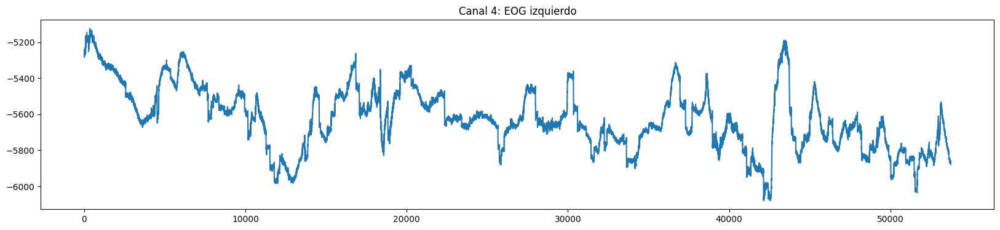

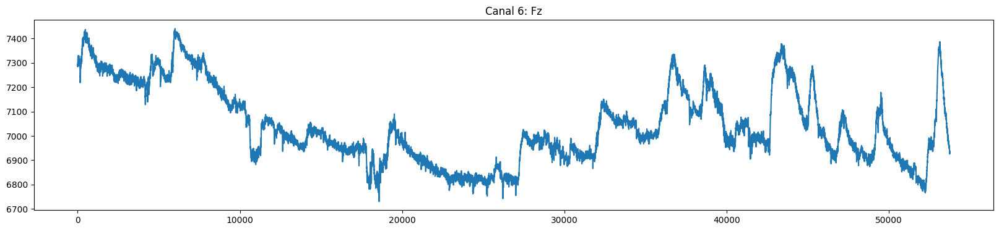

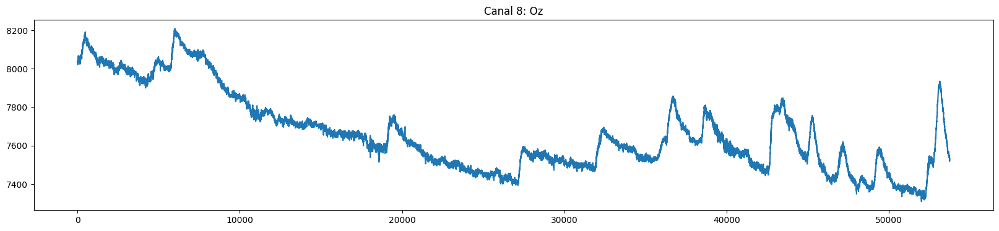

In [ ]:
canales_graf(flash1,tiempof1)

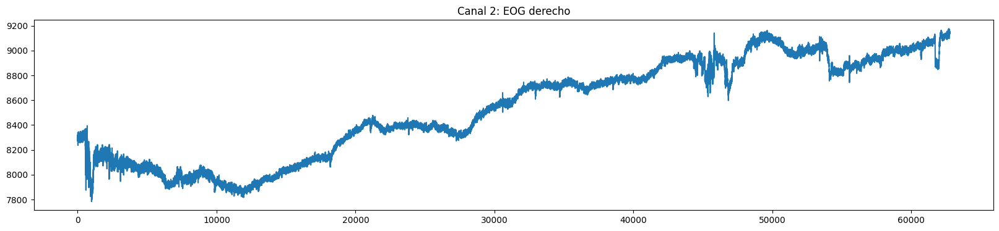

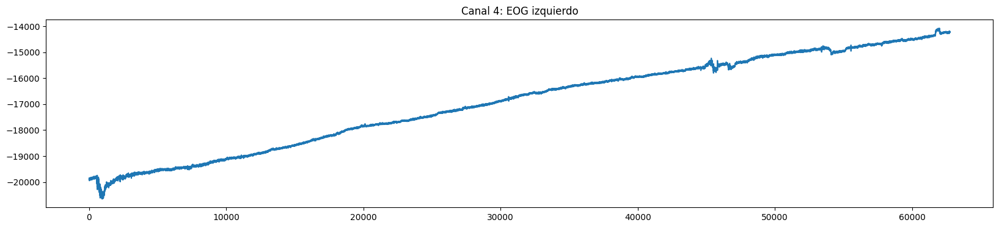

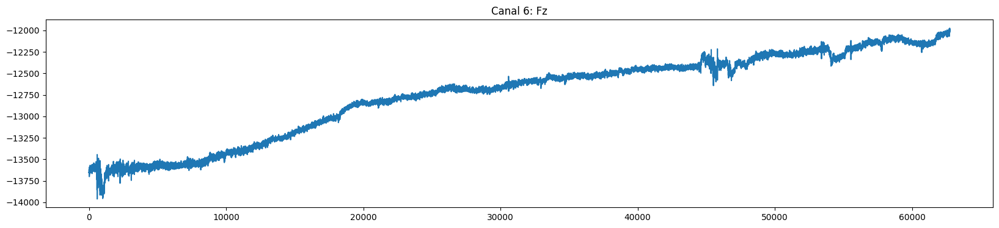

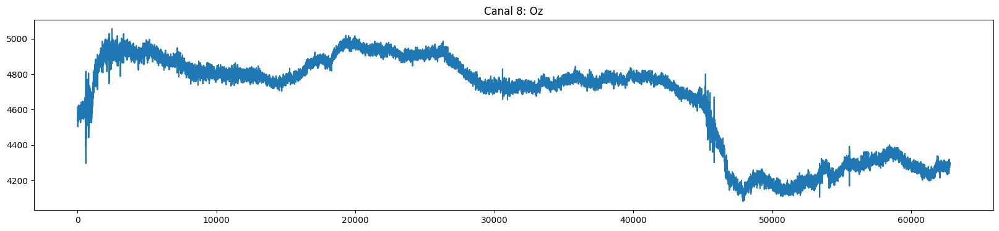

In [ ]:
canales_graf(flash2,tiempof2)

##3 - Preprocesamiento

Se crea un diccionario para llenar con las señales filtradas

In [ ]:
senales_chess = {}
senales_flash = {}

###3.1 - Filtro Pasa Bandas

Se genera una función para filtrar las frecuencias altas (mayores a 60Hz) que están presentes en los canales del EEG. Este filtro también elimina las frecuencias menores a 0.5 Hz, eliminando el ruido de deriva.

In [ ]:
def bp_filter(datos,tiempo):

  #Filtro pasa altos de la señal
  N = 5
  wn = [0.5,60] #Queremos eliminar el ruido de deriva y las altas frecuencias

  for c in canales:
    if c not in [3,5,7,9]:
      continue

    a_procesar = np.array(datos[f"Columna{c}"][100:])

    [b,a] = signal.butter(N, wn, btype = 'bandpass', fs = fs)
    filtrada = signal.lfilter(b,a,a_procesar)

    if c == 3:
      titulo = 'EOG derecho'
      filtrada2 = filtrada[2000:]
    if c == 5:
      titulo = 'EOG izquierdo'
      filtrada4 = filtrada[2000:]
    if c == 7:
      titulo = 'Fz'
      filtrada6 = filtrada[2000:]
    if c == 9:
      titulo = 'Oz'
      filtrada8 = filtrada[2000:]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 4))
    ax1.plot((tiempo[100:]/fs)[2000:],a_procesar[2000:])
    ax1.set_title(titulo +" sin filtrar")
    ax1.set_xlabel('Tiempo [s]')
    ax1.set_ylabel('Amplitud [uV]')
    #plt.xlim([0,700])
    ax2.plot((tiempo[100:]/fs)[2000:],filtrada[2000:])
    ax2.set_title(titulo +" filtrado")
    ax2.set_xlabel('Tiempo [s]')
    ax2.set_ylabel('Amplitud [uV]')
    #plt.xlim([0,700])

  return filtrada2 , filtrada4 , filtrada6, filtrada8

#CUando procesamos nos chequeamos  movimientos y vemos
#CUando elimino el movimiento lo saco y pego las señales.
#5565TAnalizar por segmentos, mini epocas, segmentos con movimientos los elimino. Y pego la sub epoca
#Paper clave con datos de frecuencias de filtrado de eog: https://repositorio.uniandes.edu.co/bitstream/handle/1992/23697/u303515.pdf?sequence=1

#EOG entre las 2 hago una informacion general, ya sea promediando o uno menos el otro.

A continuación se puede observar como se elimina el ruido de deriva en todos los canales de los archivos de **ajedrez (convencional y rojo y verde).**

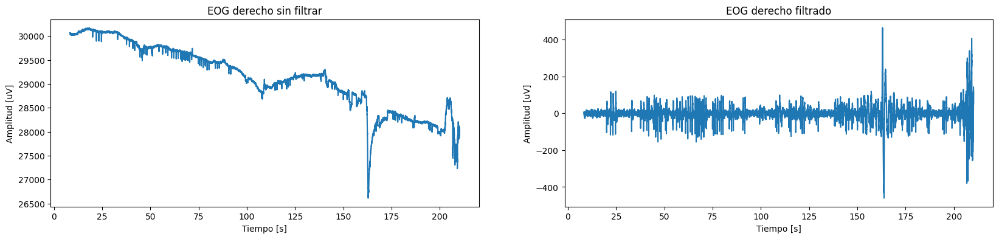

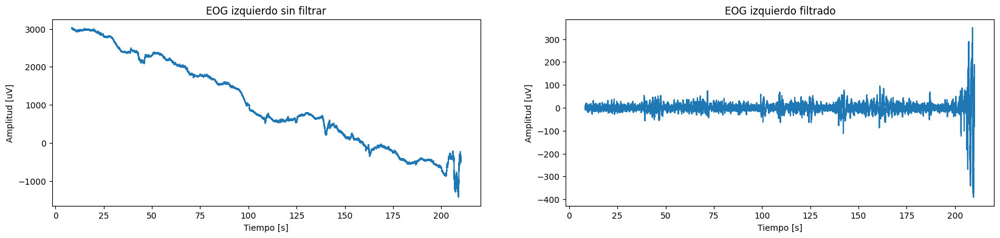

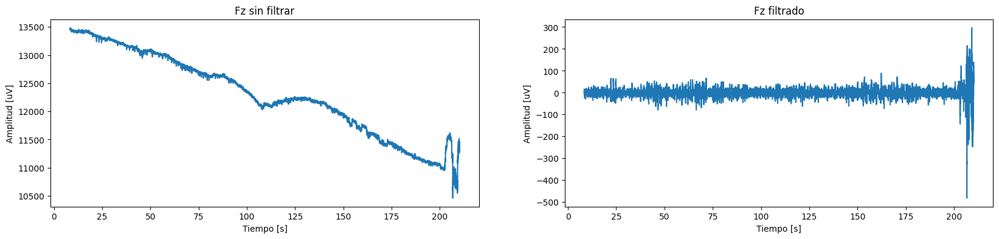

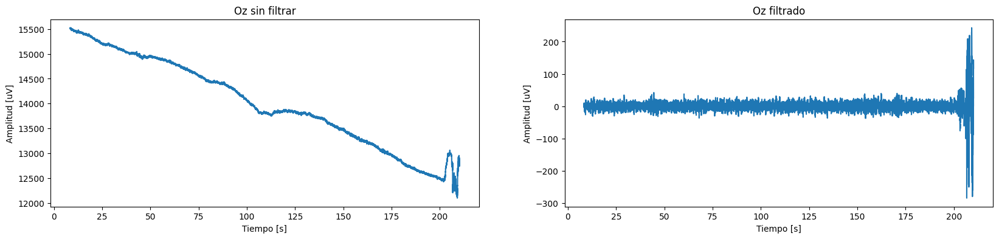

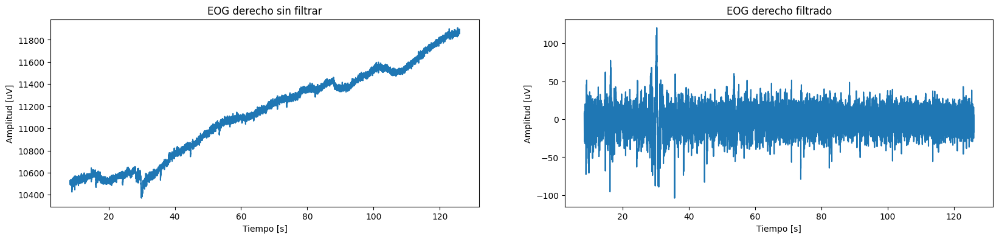

...

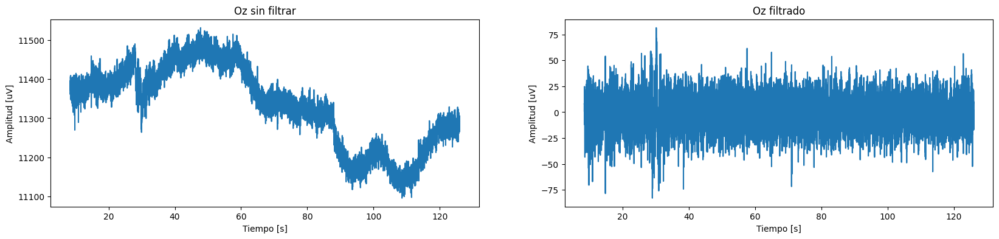

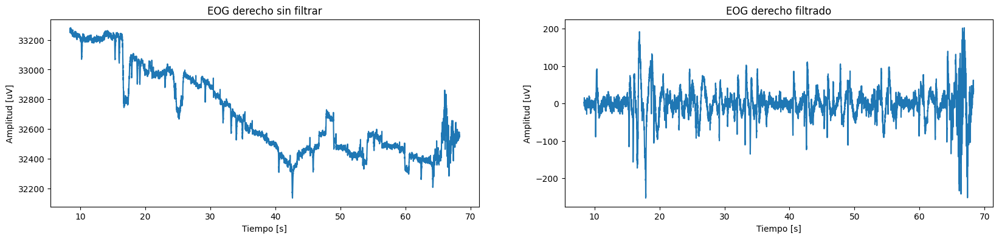

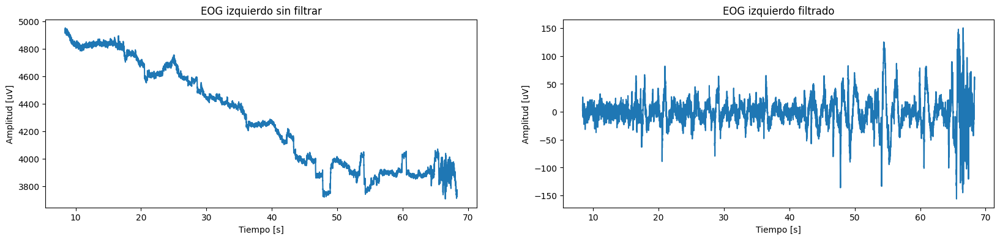

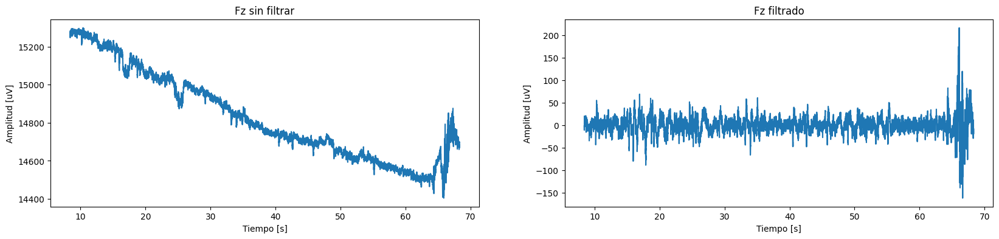

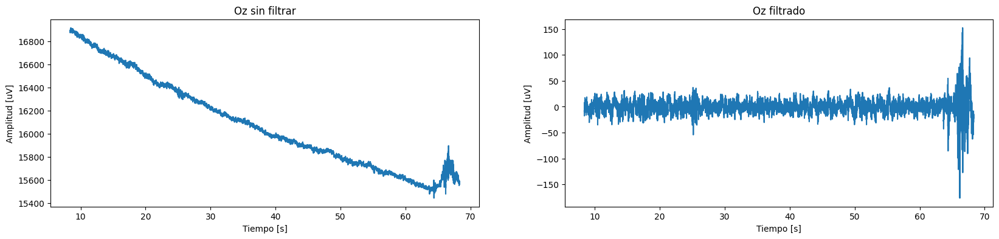

In [ ]:
for i in range(4):
  if i !=0:
    f2, f4, f6, f8 = bp_filter(vars()['datos' + str(i)],vars()['tiempo' + str(i)])
    senales_chess[f'EOGd_p{i}'] = f2
    senales_chess[f'EOGi_p{i}'] = f4
    senales_chess[f'Fz_p{i}'] = f6
    senales_chess[f'Oz_p{i}'] = f8

**Para los archivos de flash:**

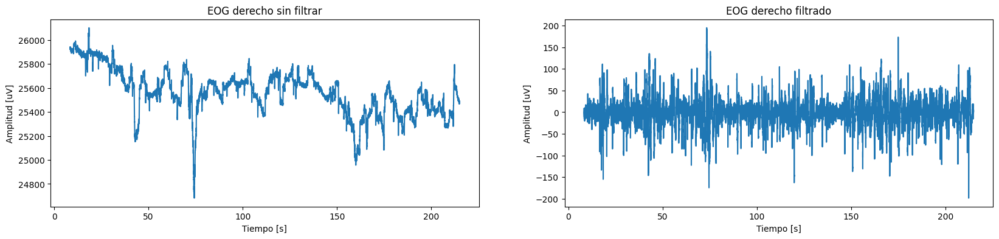

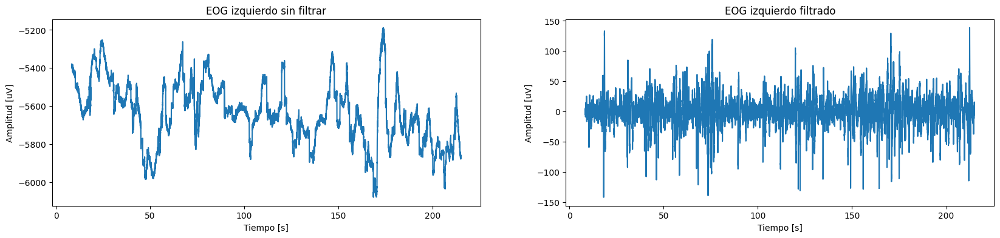

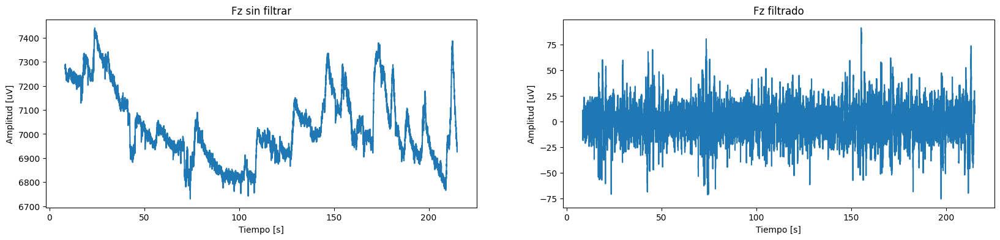

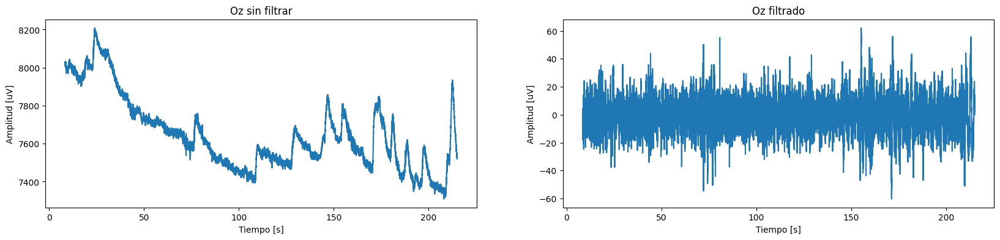

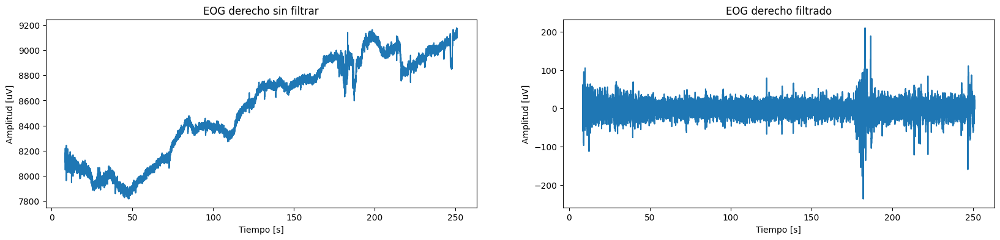

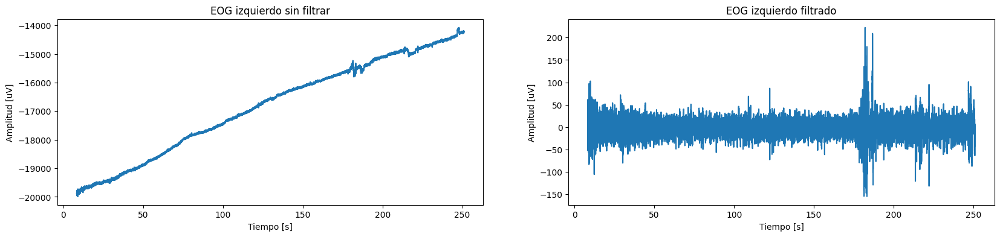

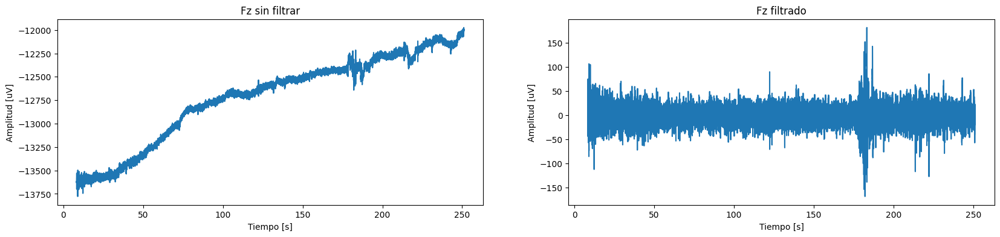

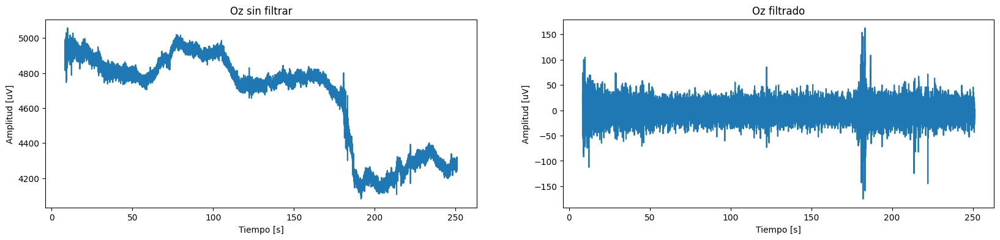

In [ ]:
for i in range(3):
  if i !=0:
    f2, f4, f6, f8 = bp_filter(vars()['flash' + str(i)],vars()['tiempof' + str(i)])
    senales_flash[f'EOGd_p{i}'] = f2
    senales_flash[f'EOGi_p{i}'] = f4
    senales_flash[f'Fz_p{i}'] = f6
    senales_flash[f'Oz_p{i}'] = f8

###3.2 - Filtro Notch

A continuación, se realiza un **espectograma** de uno de los canales  Fz y Oz de los pacientes*, con la finalidad de observar si hay ruidos constantes y sus armónicos. En este espectograma se puede notar la atenuación de las frecuencias superiores a 60Hz, producto del pasabandas.

*
En esta sección solo se muestra el espectrograma correspondiente al paciente 1 observando el ajedrez convencional. El resto de los espectrogramas se encuentra en la sección *Anexo*.

In [ ]:
def espectrograma(datos):

  plt.figure(figsize = (10,7))
  spectrum, fr, ti, im = plt.specgram(datos[f"Columna7"], Fs=fs)
  plt.xlabel('Tiempo[s]')
  plt.ylabel('Frecuencia[Hz]')
  plt.title('Espectograma Fz')

  plt.figure(figsize = (10,7))
  spectrum, fr, ti, im = plt.specgram(datos[f"Columna9"], Fs=fs)
  plt.xlabel('Tiempo[s]')
  plt.ylabel('Frecuencia[Hz]')
  plt.title('Espectograma Oz')

  plt.show()

Espectrograma para el paciente 1.

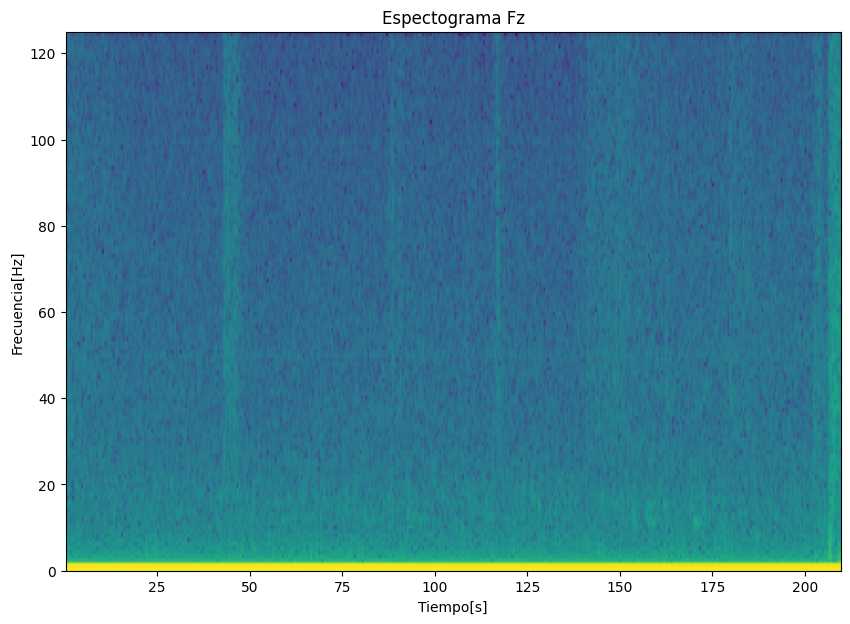

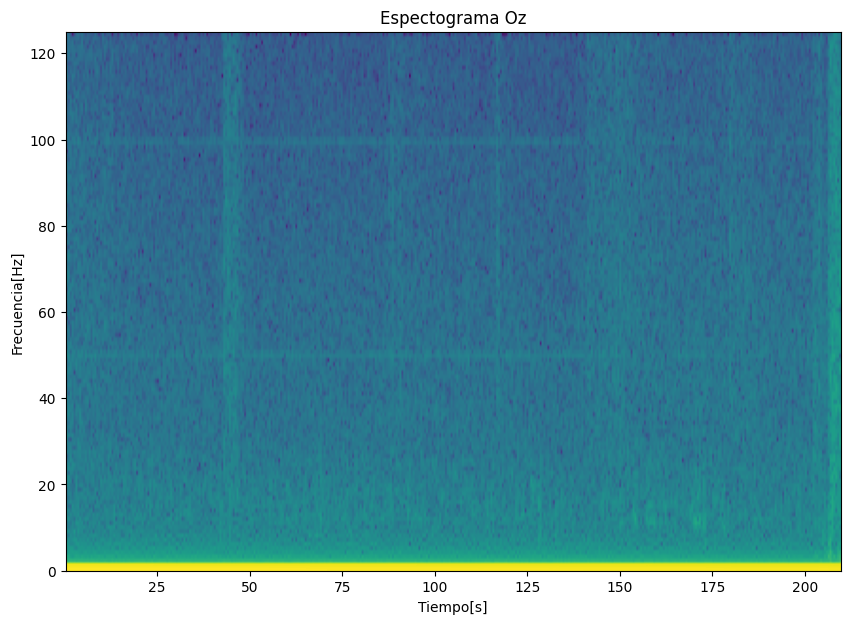

In [ ]:
espectrograma(datos1)

Aunque es muy tenue, se puede observar ruido en 50 Hz constante en todo el muestreo.
Por ende, se aplicó un notch para eliminar la frecuencia de 50hz a todos los archivos. Si bien el único archivo en el que el ruido es evidente es el primero, teniendo en cuenta que la señal de 50Hz suele estar asociada a ruido eléctrico proveniente de la red, se considera que eliminar esta frecuencia para todas las muestras es una buena práctica.

In [ ]:
def bs_filter(senales, persona):
  #Filtro notch de la señal
  N = 4
  wn = [48,52] #Queremos eliminar el ruido de 50 Hz

  for c in canales:
    if c not in [3,5,7,9]:
      continue

    if c == 3:
      a_procesar = np.array(senales[f'EOGd_p{persona}'])
      [b,a] = signal.butter(N, wn, btype = 'bandstop', fs = fs)
      filtrada = signal.lfilter(b,a,a_procesar)
      filtrada2 = filtrada
    if c == 5:
      a_procesar = np.array(senales[f'EOGi_p{persona}'])
      [b,a] = signal.butter(N, wn, btype = 'bandstop', fs = fs)
      filtrada = signal.lfilter(b,a,a_procesar)
      filtrada4 = filtrada
    if c == 7:
      a_procesar = np.array(senales[f'Fz_p{persona}'])
      [b,a] = signal.butter(N, wn, btype = 'bandstop', fs = fs)
      filtrada = signal.lfilter(b,a,a_procesar)
      filtrada6 = filtrada
    if c == 9:
      a_procesar = np.array(senales[f'Oz_p{persona}'])
      [b,a] = signal.butter(N, wn, btype = 'bandstop', fs = fs)
      filtrada = signal.lfilter(b,a,a_procesar)
      filtrada8 = filtrada

  return filtrada2, filtrada4, filtrada6, filtrada8
#CUando procesamos nos chequeamos  movimientos y vemos
#CUando elimino el movimiento lo saco y pego las señales.
#5565TAnalizar por segmentos, mini epocas, segmentos con movimientos los elimino. Y pego la sub epoca
#Paper clave con datos de frecuencias de filtrado de eog: https://repositorio.uniandes.edu.co/bitstream/handle/1992/23697/u303515.pdf?sequence=1

#EOG entre las 2 hago una informacion general, ya sea promediando o uno menos el otro.

In [ ]:
for i in range(4):
  if i !=0:
    f2, f4, f6, f8 = bs_filter(senales_chess, i)
    senales_chess[f'EOGd_p{i}'] = f2
    senales_chess[f'EOGi_p{i}'] = f4
    senales_chess[f'Fz_p{i}'] = f6
    senales_chess[f'Oz_p{i}'] = f8

In [ ]:
for i in range(3):
  if i !=0:
    f2, f4, f6, f8 = bs_filter(senales_flash, i)
    senales_flash[f'EOGd_p{i}'] = f2
    senales_flash[f'EOGi_p{i}'] = f4
    senales_flash[f'Fz_p{i}'] = f6
    senales_flash[f'Oz_p{i}'] = f8

In [ ]:
def fft(datos, senales, persona, tiempo):
  #fft de cada una de las muestras.
  for c in canales:
    if c not in [3,5,7,9]:
      continue

    a_procesar = np.array(datos[f"Columna{c}"][100:])
    #Calculo las ffts
    fft = np.abs(np.fft.fft(a_procesar))
    freq_fft = np.abs(np.fft.fftfreq(len(a_procesar))) * fs

    if c == 3:
      titulo = 'EOG derecho'
      fft_filt = np.abs(np.fft.fft(senales[f'EOGd_p{persona}']))
      freq_fft_filt = np.abs(np.fft.fftfreq(len(senales[f'EOGd_p{persona}']))) * fs
    if c == 5:
      titulo = 'EOG izquierdo'
      fft_filt = np.abs(np.fft.fft(senales[f'EOGi_p{persona}']))
      freq_fft_filt = np.abs(np.fft.fftfreq(len(senales[f'EOGi_p{persona}']))) * fs
    if c == 7:
      titulo = 'Fz'
      fft_filt = np.abs(np.fft.fft(senales[f'Fz_p{persona}']))
      freq_fft_filt = np.abs(np.fft.fftfreq(len(senales[f'Fz_p{persona}']))) * fs
    if c == 9:
      titulo = 'Oz'
      fft_filt = np.abs(np.fft.fft(senales[f'Oz_p{persona}']))
      freq_fft_filt = np.abs(np.fft.fftfreq(len(senales[f'Oz_p{persona}']))) * fs

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 4))
    #Ploteo
    ax1.plot(freq_fft, fft)
    ax1.set_xlabel('Frecuencia (Hz)')
    ax1.set_ylabel('Amplitud')
    ax1.set_title('FFT Original de '+ titulo)
    ax1.set_ylim([800,120000])

    ax2.plot(freq_fft_filt, fft_filt, color='#71BBE8')
    ax2.set_xlabel('Frecuencia (Hz)')
    ax2.set_ylabel('Amplitud')
    ax2.set_title('FFT Filtrada de '+ titulo)

    plt.show()

Se puede ver como con este filtro se eliminó exitosamente la frecuencia de 50Hz, sin casi afectar otras frecuencias. En el caso del primer paciente, el problema quedo solucionado. También se puede observar que este ruido estaba presente en todas las muestras.

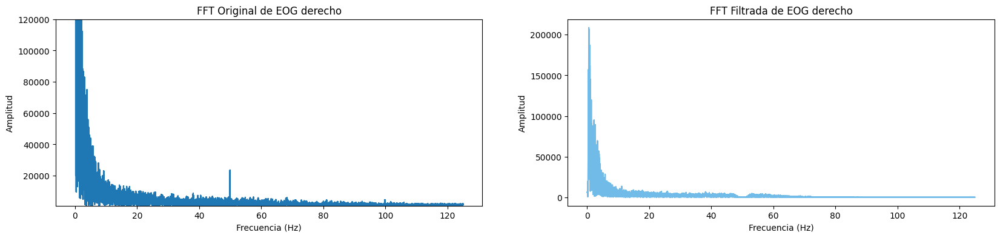

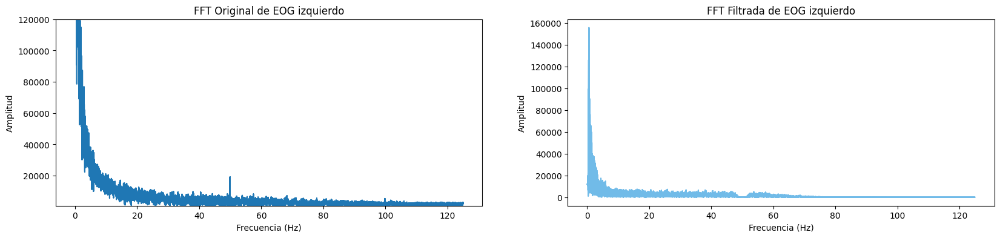

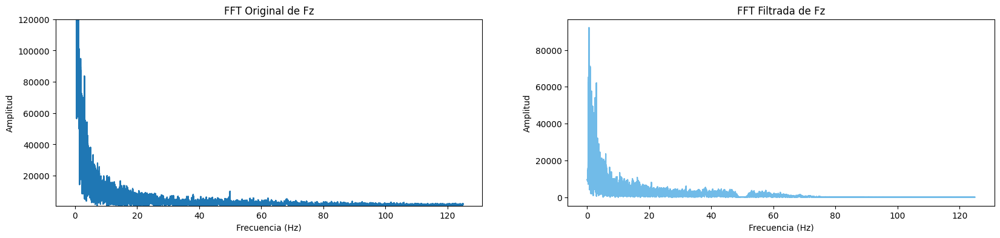

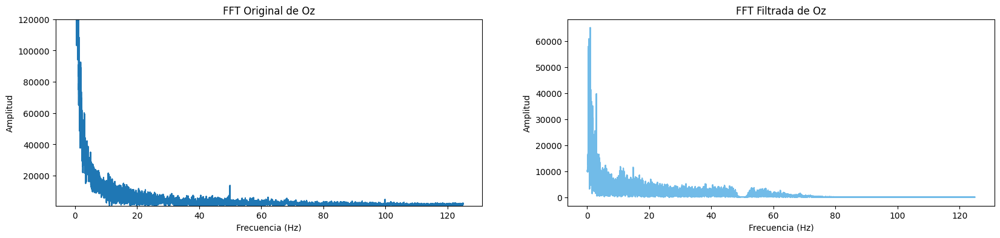

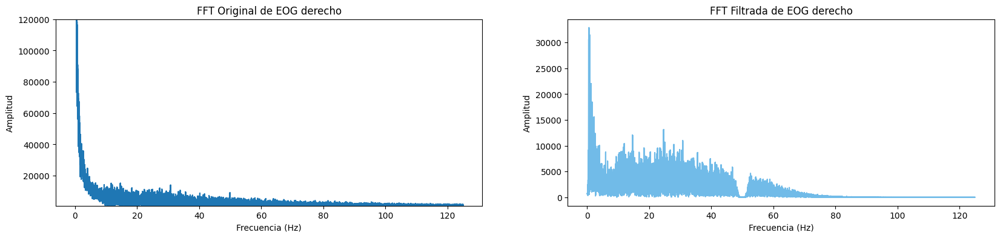

...

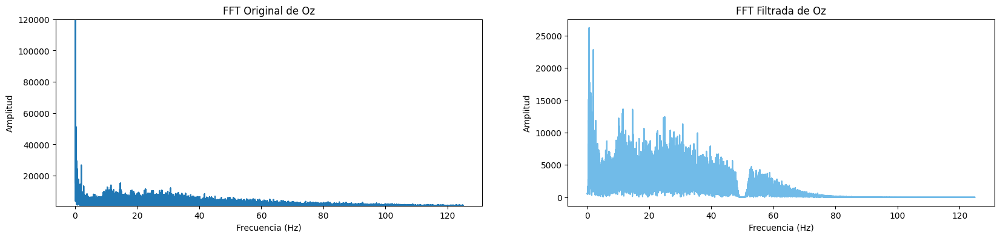

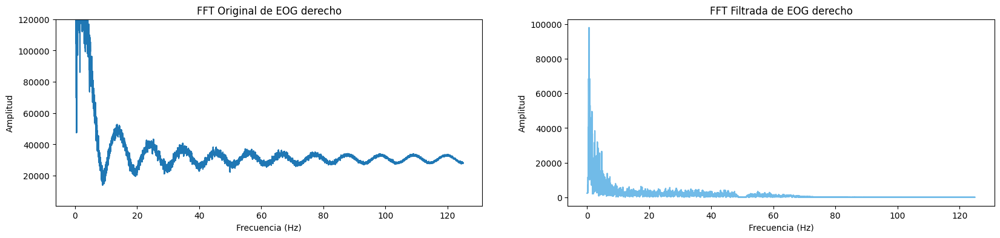

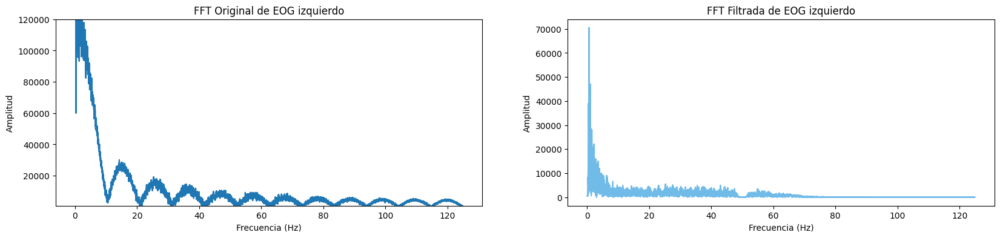

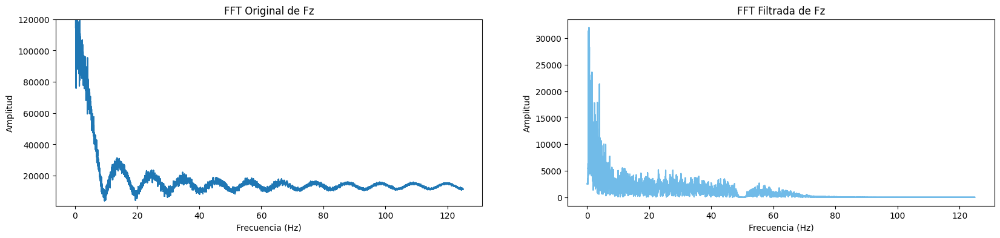

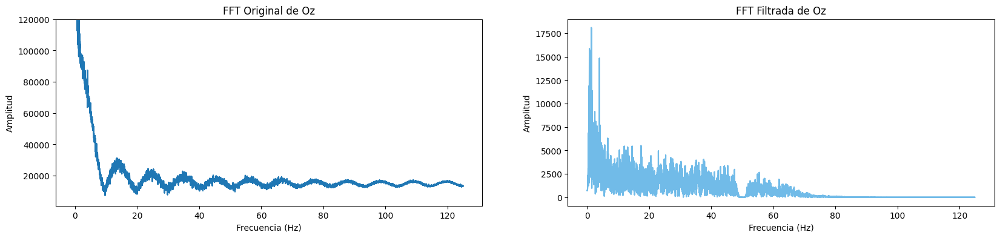

In [ ]:
for i in range(4):
  if i !=0:
    fft(vars()['datos' + str(i)], senales_chess, i, vars()['tiempo' + str(i)])

###3.3 - Filtro adaptativo

Una de las mayores fuentes de ruido en EEG es la señal de EOG. Por lo tanto, se analizaron las derivaciones que lo capturan. En primer lugar, se observaron las gráficas de las señales EOGd - EOGi y el promedio entre EOGd y EOGi.

In [ ]:
def promedios(senales, persona, tiempo):

  time = (tiempo[100:]/fs)[2000:]

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 4))
  EOG_dif = senales[f'EOGd_p{persona}']-senales[f'EOGi_p{persona}']
  ax1.plot(time, EOG_dif)
  ax1.set_title('EOGd - EOGi')
  ax1.set_xlabel('Tiempo [s]')
  ax1.set_ylabel('Amplitud [uV]')

  EOG_prom = (senales[f'EOGd_p{persona}']+senales[f'EOGi_p{persona}'])/2
  ax2.plot(time, EOG_prom)
  ax2.set_title('Promedio entre EOGd y EOGi')
  ax2.set_xlabel('Tiempo [s]')
  ax2.set_ylabel('Amplitud [uV]')

  plt.show()

  return EOG_dif, EOG_prom

#probar con cual es mejor hacer el filtro adaptativo. Ver si usar el promediado (donde se ven los blinks) o la diferencia, donde puedo ver el movimiento de baja frec de los 2 ojos
#Esto es para ver tambien si es mejor filtrar adaptativamente o si eso le mete mas ruido a la señal.

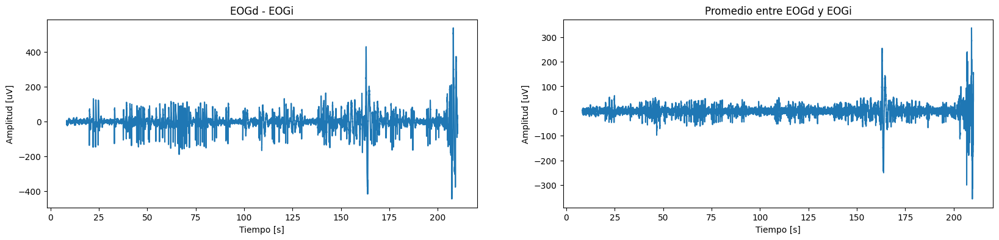

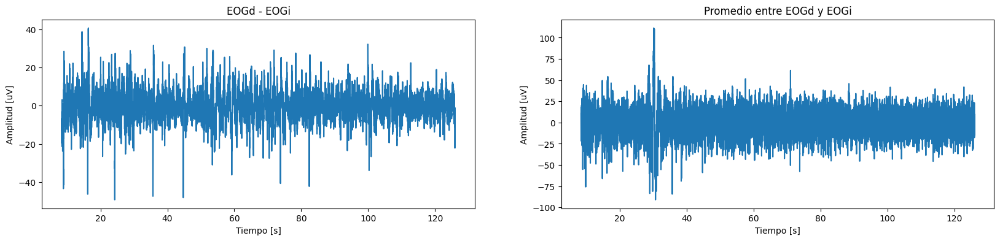

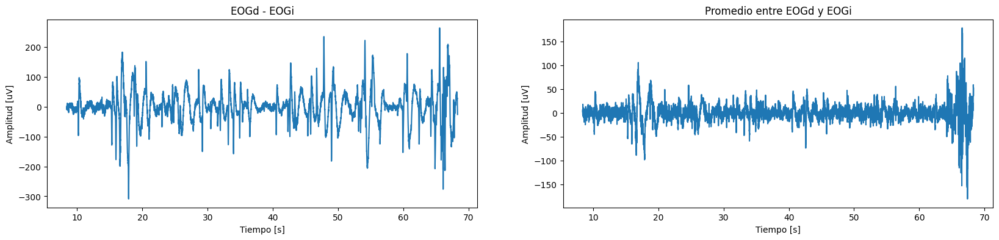

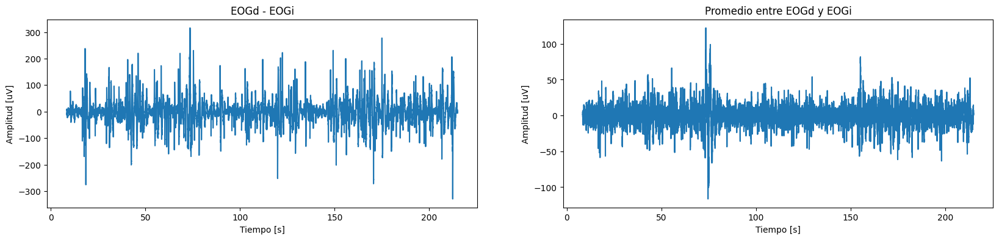

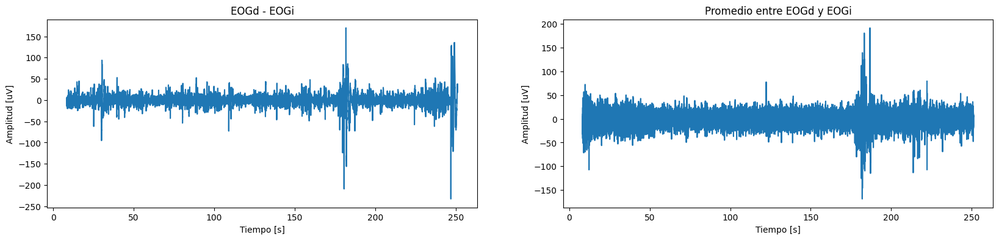

In [ ]:
dif1, prom1 = promedios(senales_chess,1,tiempo1)
dif2, prom2 = promedios(senales_chess,2,tiempo2)
dif3, prom3 = promedios(senales_chess,3,tiempo3)
dif1_f, prom1_f = promedios(senales_flash,1,tiempof1)
dif2_f, prom2_f = promedios(senales_flash,2,tiempof2)

Podemos ver que en todos los casos, el promedio entre los EOGs es más "ruidoso" que el de la diferencia de los mismos. Por lo tanto, se utilizará esa señal como referencia para implementar un filtro óptimo que reduzca el ruido de las señales de interés (Fz y Oz). La elección del orden y el coeficiente 'a' del filtro LMS tiene que ver con un compromiso entre resolución y tiempo de cómputo.

In [ ]:
def lms(x, d, L, mu):

  """
  x: señal de entrada
  d: señal deseada
  L: orden del filtro
  mu: paso para la actualización
  """

  # 0. Chequear que mu sea un valor válido

  # 1. Inicializo los pesos (y el resto de valores)
  M = x.shape[0]
  h = np.zeros([1,L]) # Vector pesos
  y = np.zeros([1,M])
  e = np.zeros([1,M])

  for i in range(L,M):
    #print("i",i,"\n")
    x1 = x[i:i-L:-1]
    #print("x1:", x1)

    y[0,i] = h.dot(x1) # 2. Calculo la salida del filtro

    e[0,i] = d[i] - y[0,i] # 3. Obtengo la señal de error

    h = h + mu *e[0,i] * x1 # 4. Actualizo los pesos
    #print("h", h)

  h = h[0]

  return h

In [ ]:
time1 = (tiempo1[100:]/fs)[2000:]
time2 = (tiempo2[100:]/fs)[2000:]
time3 = (tiempo3[100:]/fs)[2000:]
time1_f = (tiempof1[100:]/fs)[2000:]
time2_f = (tiempof2[100:]/fs)[2000:]

In [ ]:
L= 2**10 #orden del filtro
Px = np.mean((senales_chess['Oz_p3'])**2) #aproximación de la potencia
a=0.1
mu = a*(1/(10*L*Px))

t=np.linspace(0,len(senales_chess['Oz_p3']),len(senales_chess['Oz_p3']))

op_dif = lms(senales_chess['Oz_p3'],dif3,L,mu)
op_prom = lms(senales_chess['Oz_p3'],prom3,L,mu)

filter_dif = sp.signal.lfilter(op_dif, 1, senales_chess['Oz_p3'])
filter_prom = sp.signal.lfilter(op_prom, 1, senales_chess['Oz_p3'])

filtrada_prom = senales_chess['Oz_p3'] - filter_prom
filtrada_dif = senales_chess['Oz_p3'] - filter_dif

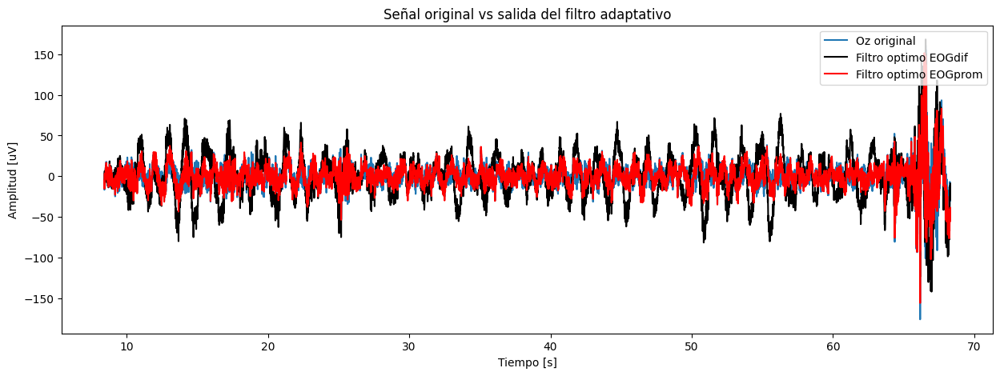

In [ ]:
#Ver EOG vs filtrada EOGprom vs filtrada EOGdif
plt.rcParams["figure.figsize"] = [15, 5]
plt.plot(time3,senales_chess['Oz_p3'], label='Oz original')
plt.plot(time3,filtrada_dif, label='Filtro optimo EOGdif', color='black')
plt.plot(time3,filtrada_prom, label='Filtro optimo EOGprom', color='red')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.title('Señal original vs salida del filtro adaptativo')
plt.legend(loc='upper right')
plt.show()

El filtro óptimo hecho con el promedio de los EOG filtra mucho mejor que el que está hecho con la diferencia. Se puede ver que este último le quita mucha definición a la señal y la agranda en magnitud. Aún así, el efecto del filtro óptimo sobre la señal es mínimo.

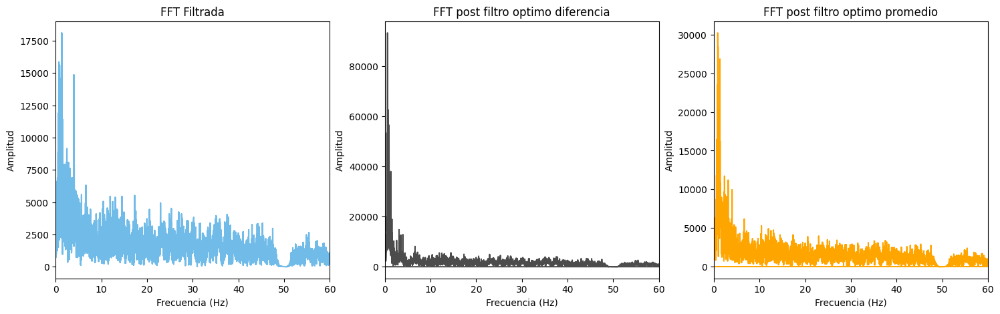

In [ ]:
fft_op = np.abs(np.fft.fft(filtrada_dif))
freq_fft_op = np.fft.fftfreq(len(filtrada_dif))*fs

fft_op1 = np.abs(np.fft.fft(filtrada_prom))
freq_fft_op1 = np.fft.fftfreq(len(filtrada_prom))*fs


fft_filt = np.abs(np.fft.fft(senales_chess['Oz_p3']))
freq_fft_filt = np.abs(np.fft.fftfreq(len(senales_chess['Oz_p3']))) * fs

# Grafico

fig, (ax1,ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

ax1.plot(freq_fft_filt, fft_filt, color='#71BBE8')
ax1.set_xlabel('Frecuencia (Hz)')
ax1.set_ylabel('Amplitud')
ax1.set_title('FFT Filtrada')
ax1.set_xlim([0, 60])

ax2.plot(freq_fft_op, fft_op, color = 'black', alpha=0.7)
ax2.set_xlabel('Frecuencia (Hz)')
ax2.set_ylabel('Amplitud')
ax2.set_title('FFT post filtro optimo diferencia')
ax2.set_xlim([0,60])

ax3.plot(freq_fft_op1, fft_op1, color = "orange")
ax3.set_xlabel('Frecuencia (Hz)')
ax3.set_ylabel('Amplitud')
ax3.set_title('FFT post filtro optimo promedio')
ax3.set_xlim([0,60])

plt.show()


La señal filtrada con el promedio de EOG respeta mucho mejor la señal de entrada, mientras que la filtrada con la diferencia de EOG atenúa muchas frecuencias. Por lo tanto, se toma como referencia para el filtrado adaptativo la señal promediada de EOG.

**Aplicación del filtro adaptativo en todas las señales**

El filtro es aplicado a todos los sets de datos y almacenado en diccionarios según el tipo de estudio.

In [ ]:
senales_FA_chess = {}
senales_FA_flash = {}

In [ ]:
def lms_a_todo(senales,time, persona, EOG_prom, diccionario):
  L= 2**10 #orden del filtro
  a=0.1

  #Calculo filtros
  Px1 = np.mean((senales[f'Fz_p{persona}'])**2) #aproximación de la potencia
  mu1 = a*(1/(10*L*Px1))
  t1 =np.linspace(0,len(senales[f'Fz_p{persona}']),len(senales[f'Fz_p{persona}']))
  op1 = lms(senales[f'Fz_p{persona}'],EOG_prom,L,mu1)
  filter1 = sp.signal.lfilter(op1, 1, senales[f'Fz_p{persona}'])
  diccionario[f'Fz_p{persona}'] = senales[f'Fz_p{persona}'] - filter1

  Px2 = np.mean((senales[f'Oz_p{persona}'])**2) #aproximación de la potencia
  mu2 = a*(1/(10*L*Px2))
  t2=np.linspace(0,len(senales[f'Oz_p{persona}']),len(senales[f'Oz_p{persona}']))
  op2 = lms(senales[f'Oz_p{persona}'],EOG_prom,L,mu2)
  filter2 = sp.signal.lfilter(op2, 1, senales[f'Oz_p{persona}'])
  diccionario[f'Oz_p{persona}'] = senales[f'Oz_p{persona}'] - filter2

  #Ploteo filtros

  fig, (ax2, ax3) = plt.subplots(2, 1, figsize=(18, 12))
  ax2.plot(time, senales[f'Oz_p{persona}'], label='Señal Oz original')
  ax2.plot(time, diccionario[f'Oz_p{persona}'], label='Señal Oz filtrada adaptativamente con promedio EOG', color='red')
  ax2.set_xlabel('Tiempo [s]')
  ax2.set_ylabel('Amplitud [uV]')
  ax2.set_title('Oz filtrado adaptativamente con EOG')
  ax2.legend(loc='upper left')

  ax3.plot(time, senales[f'Fz_p{persona}'], label='Señal Fz original')
  ax3.plot(time, diccionario[f'Fz_p{persona}'], label='Señal Fz filtrada adaptativamente con promedio EOG', color='red')
  ax3.set_xlabel('Tiempo [s]')
  ax3.set_ylabel('Amplitud [uV]')
  ax3.set_title('Fz filtrado adaptativamente con EOG')
  ax3.legend(loc='upper left')


  plt.show()

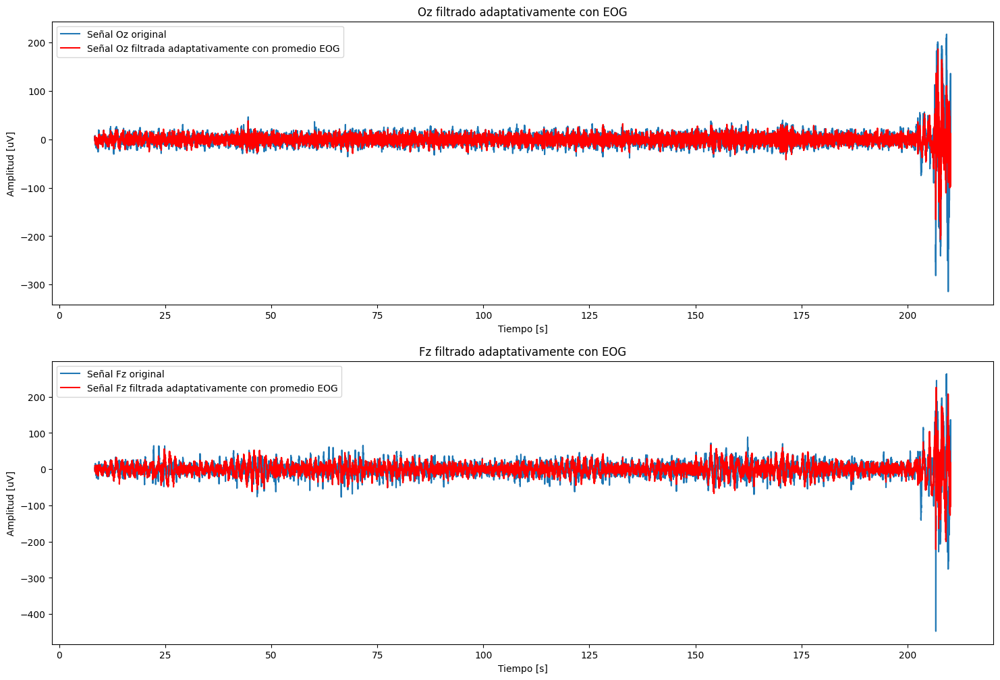

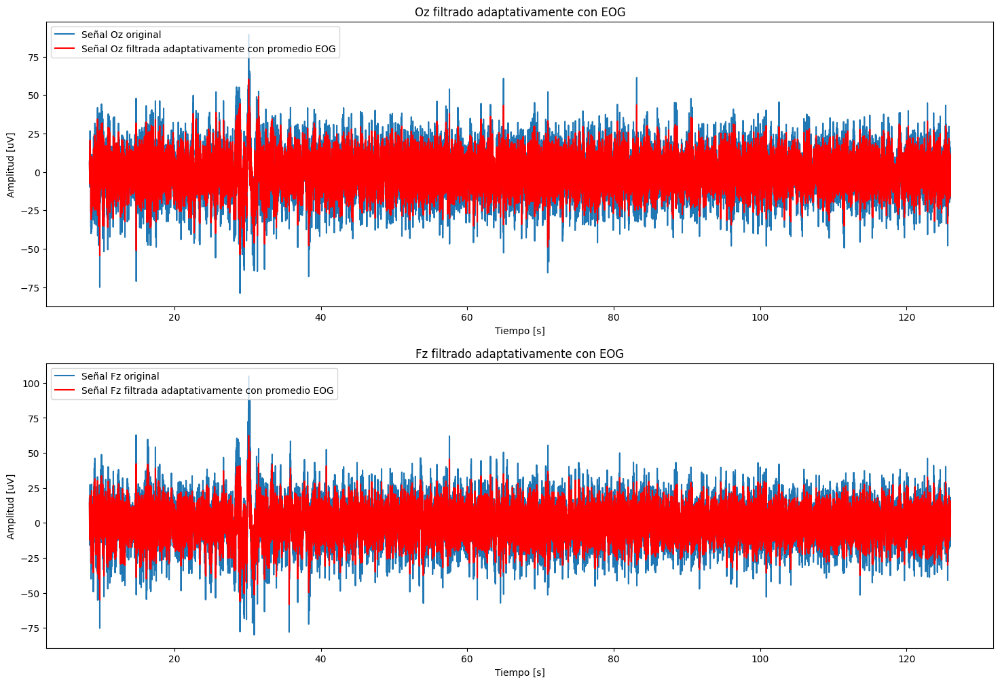

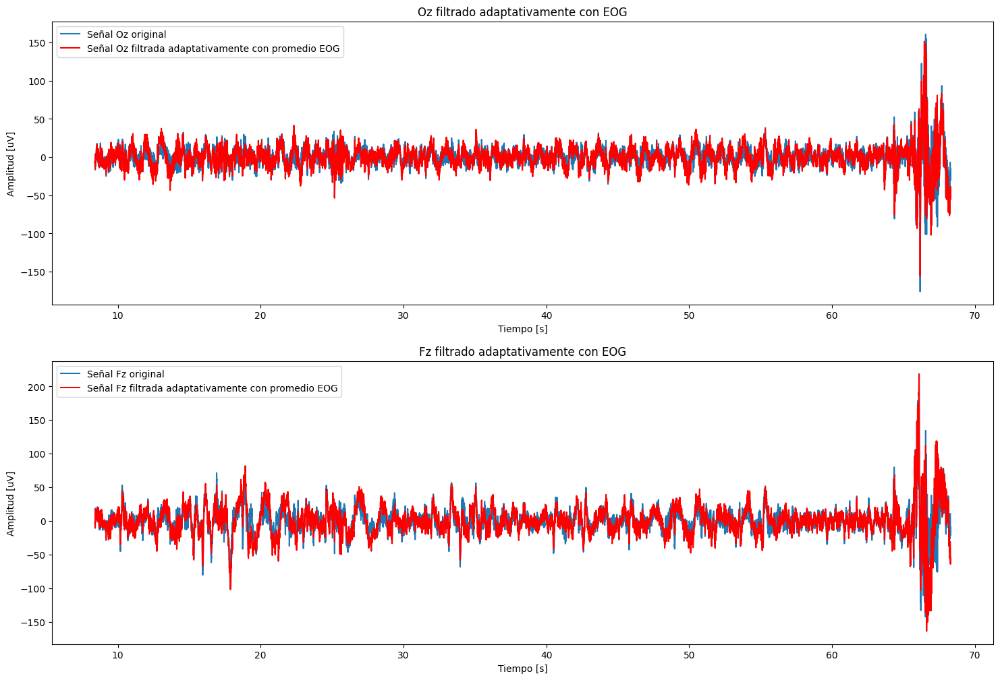

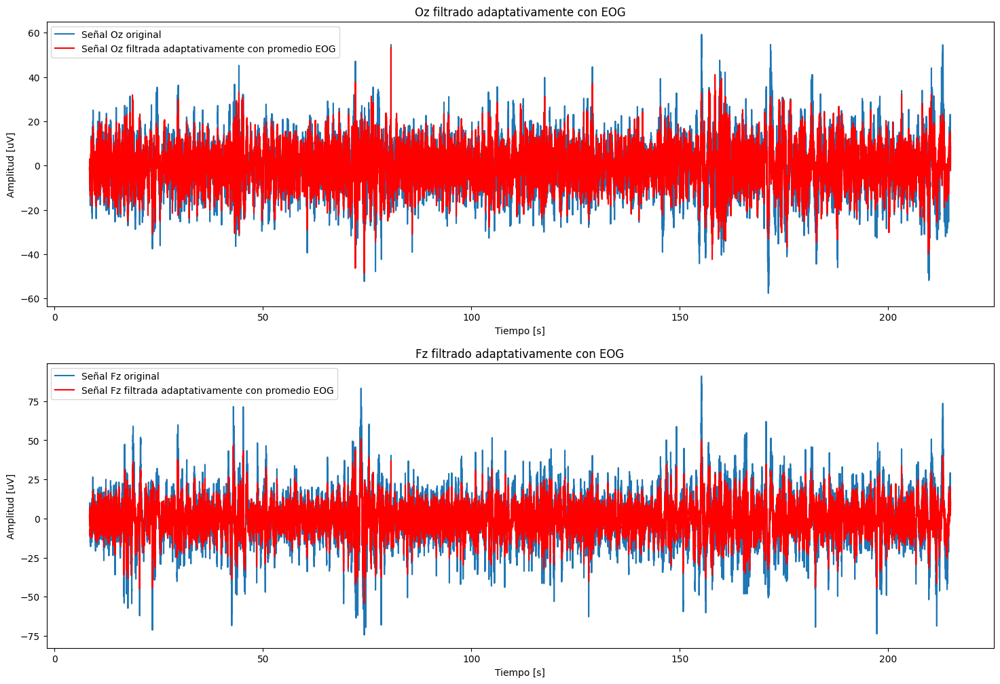

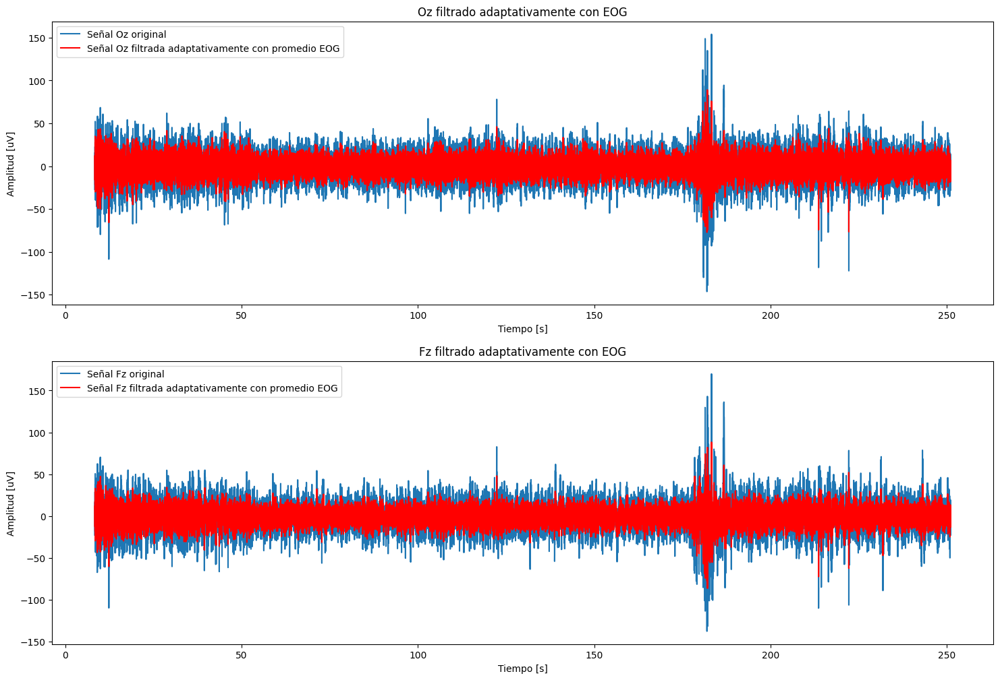

In [ ]:
lms_a_todo(senales_chess,time1,1,prom1,senales_FA_chess)
lms_a_todo(senales_chess,time2,2,prom2,senales_FA_chess)
lms_a_todo(senales_chess,time3,3,prom3,senales_FA_chess)
lms_a_todo(senales_flash,time1_f,1,prom1_f,senales_FA_flash)
lms_a_todo(senales_flash,time2_f,2,prom2_f,senales_FA_flash)

Como se puede ver, en los últimos segundos, en el primer y en el tercer paciente, tanto en Oz como en Fz la señal cambia notoriamente. Esto puede deberse a que el sujeto comenzó a moverse y apareció mucho ruido en la señal. Por lo tanto, se extrajeron esas últimas muestras para el análisis posterior. Como se mencionó anteriormente, la extracción de las muestras se hizo uniformemente para todos los pacientes, con el motivo de estandarizar el procesamiento.

In [ ]:
#Se recortan los últimos 10 segundos de información.

new_len1 = len(time1)-2546
new_len2 = len(time2)-2546
new_len3 = len(time3)-2546
new_len1_f = len(time1_f)-2546
new_len2_f = len(time2_f)-2546

time1 = time1[:new_len1]
time2 = time2[:new_len2]
time3 = time3[:new_len3]
time1_f = time1_f[:new_len1_f]
time2_f = time2_f[:new_len2_f]

A continuación, el resultado final para todas las muestras. Los vectores se almacenaron en un nuevo diccionario.

In [ ]:
senales_FA_chess['Fz_p1'] = senales_FA_chess['Fz_p1'][:new_len1]
senales_FA_chess['Oz_p1'] = senales_FA_chess['Oz_p1'][:new_len1]
senales_FA_chess['Fz_p2'] = senales_FA_chess['Fz_p2'][:new_len2]
senales_FA_chess['Oz_p2'] = senales_FA_chess['Oz_p2'][:new_len2]
senales_FA_chess['Fz_p3'] = senales_FA_chess['Fz_p3'][:new_len3]
senales_FA_chess['Oz_p3'] = senales_FA_chess['Oz_p3'][:new_len3]
senales_FA_flash['Fz_p1'] = senales_FA_flash['Fz_p1'][:new_len1_f]
senales_FA_flash['Oz_p1'] = senales_FA_flash['Oz_p1'][:new_len1_f]
senales_FA_flash['Fz_p2'] = senales_FA_flash['Fz_p2'][:new_len2_f]
senales_FA_flash['Oz_p2'] = senales_FA_flash['Oz_p2'][:new_len2_f]

**Enfoque alternativo: regresión lineal**

Otra forma de reducir el ruido es utilizar la regresión lineal. En este caso, el filtro en configuración ANC pasa a ser la regresión lineal. Los resultados para la sección *4 - Procesamiento* son muy similares a los obtenidos con la señal filtrada a partir del filtro óptimo. Los mismos se pueden observar en *Anexo. 4 - Procesamiento*.

La librería y la función implementada con esta finalidad se pueden observar a continuación:

In [ ]:
from sklearn.linear_model import LinearRegression

def regresion_lineal(EOG_prom, señal):

  EOG_prom = np.array(EOG_prom)
  EOG_prom = EOG_prom.reshape((-1,1))
  regressor = LinearRegression()
  regressor.fit(EOG_prom, señal)
  predicted_noise = regressor.predict(EOG_prom)
  denoised_eeg = señal - predicted_noise

  return denoised_eeg

##4 - Procesamiento


###4.1 - Promedio homogéneo

En la totalidad del tiempo de cada señal tenemos múltiples potenciales evocados. La idea es, utilizando como referencia el vector de marcadores (última columna de cada archivo), separarlos a todos y realizar un promedio entre ellos para reducir el ruido y encontrar la forma de onda.

In [ ]:
def markers(data, new_len, time):
  marcadores = data[:,23] #Este es el canal de los marcadores
  marcadores = marcadores[2000:new_len+2000] #Se acomoda la cantidad de elementos para que coincida con Fz y Oz
  plt.plot(time,marcadores)
  plt.show()

  return marcadores

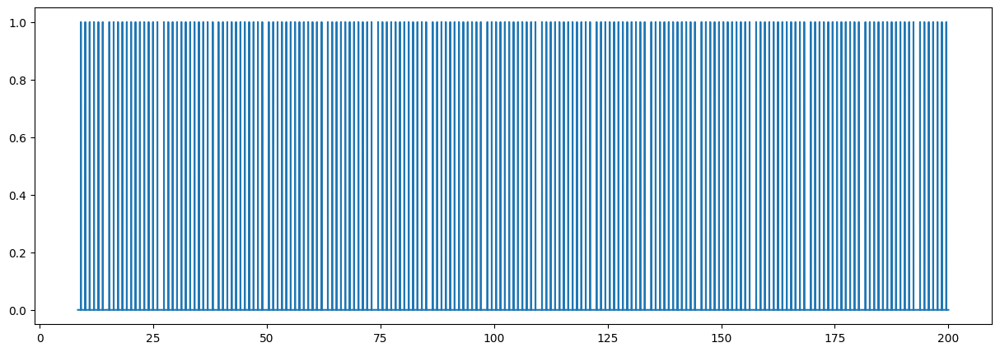

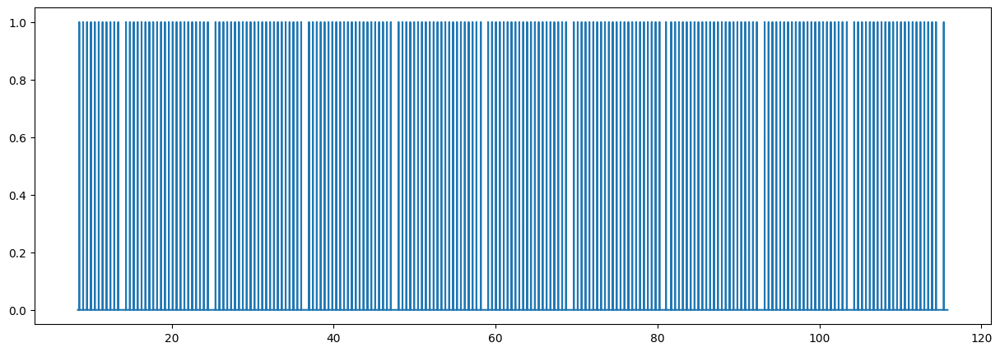

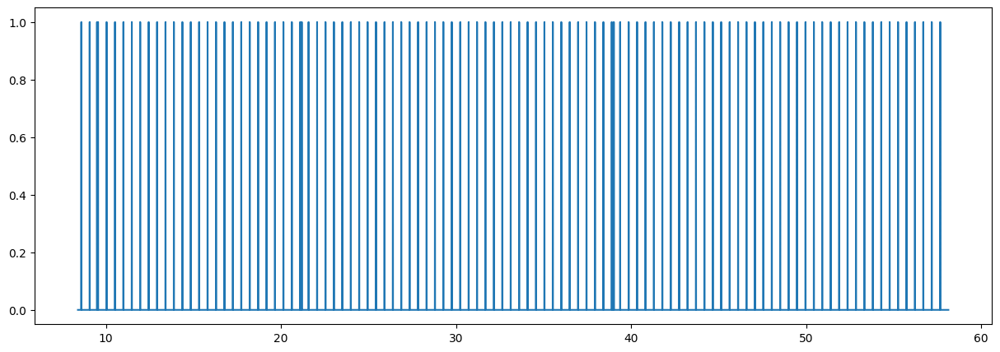

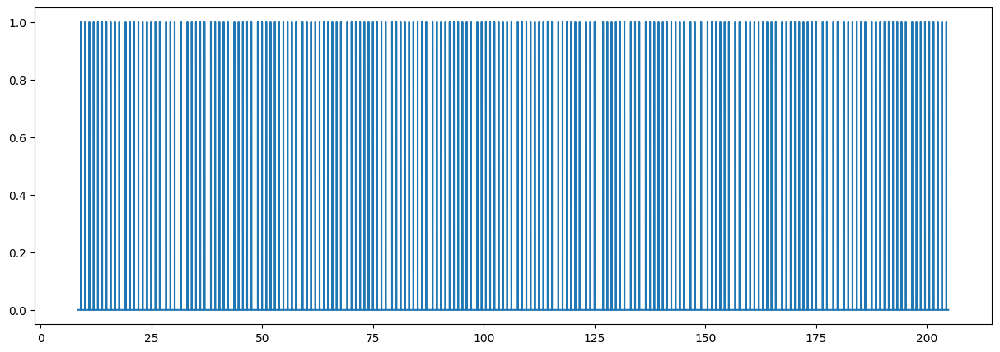

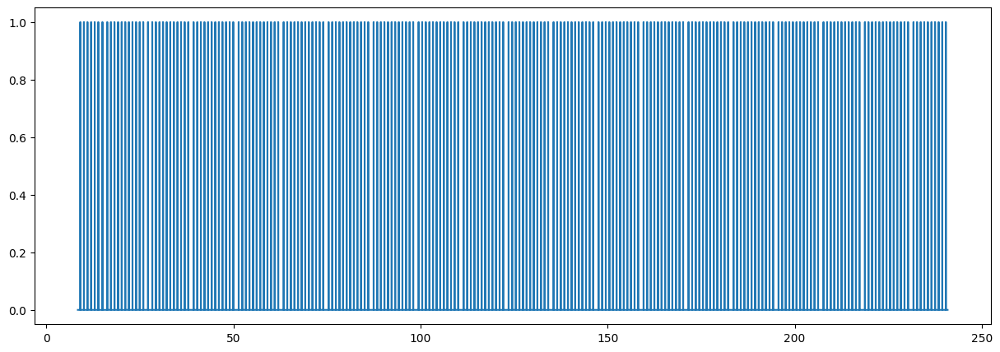

In [ ]:
marcadores1 = markers(data1, new_len1, time1)
marcadores2 = markers(data2, new_len2, time2)
marcadores3 = markers(data3, new_len3, time3)
marcadores1_f = markers(dataf1, new_len1_f,time1_f)
marcadores2_f = markers(dataf2, new_len2_f,time2_f)

Los marcadores indican el momento en el cual hubo un estimulo que provocó un potencial evocado. Se puede observar que los marcadores no aparecen de forma uniforme en el tiempo. Para solucionar esto, a partir de la aparición de un marcador, se recortan 0.3 segundos de señal (300ms/75 muestras) en todos los casos. Este recorte se fundamenta en la latencia que suelen tener los picos más característicos de los potenciales evocados según la bibliografía [1][2][3].

In [ ]:
senales_Fz_p1 = senales_FA_chess['Fz_p1'].tolist()
senales_Oz_p1 = senales_FA_chess['Oz_p1'].tolist()

senales_Fz_p2 = senales_FA_chess['Fz_p2'].tolist()
senales_Oz_p2 = senales_FA_chess['Oz_p2'].tolist()

senales_Fz_p3 = senales_FA_chess['Fz_p3'].tolist()
senales_Oz_p3 = senales_FA_chess['Oz_p3'].tolist()

senales_Fz_p1_f = senales_FA_flash['Fz_p1'].tolist()
senales_Oz_p1_f = senales_FA_flash['Oz_p1'].tolist()

senales_Fz_p2_f = senales_FA_flash['Fz_p2'].tolist()
senales_Oz_p2_f = senales_FA_flash['Oz_p2'].tolist()

La función array_a_realizaciones() recibe el array de la derivacion y los marcadores para un paciente y devuelve un array con todas las realizaciones por separado.

In [ ]:
def array_a_realizaciones(señal, marcadores):

  pe = []
  c_pre = 0
  c_post = 0

  for i in range(len(marcadores)):
    if marcadores [i] == 1.0:
      c_pre+=1
    if marcadores[i] == 1.0 and i+76 <= len(señal):
        c_post+=1
        pe.append(señal[int(i):int(i+76)])

  return pe, c_pre, c_post

In [ ]:
#Se aplica la función a todas las derivaciones

pe_Fz_p1, cF1_pre, cF1_post = array_a_realizaciones(senales_Fz_p1, marcadores1)
pe_Oz_p1, cO1_pre, cO1_post = array_a_realizaciones(senales_Oz_p1, marcadores1)
pe_Fz_p2, cF2_pre, cF2_post = array_a_realizaciones(senales_Fz_p2, marcadores2)
pe_Oz_p2, cO2_pre, cO2_post = array_a_realizaciones(senales_Oz_p2, marcadores2)
pe_Fz_p3, cF3_pre, cF3_post = array_a_realizaciones(senales_Fz_p3, marcadores3)
pe_Oz_p3, cO3_pre, cO3_post = array_a_realizaciones(senales_Oz_p3, marcadores3)

pe_Fz_p1_f, cF1_f_pre, cF1_f_post = array_a_realizaciones(senales_Fz_p1_f, marcadores1_f)
pe_Oz_p1_f, cO1_f_pre, cO1_f_post = array_a_realizaciones(senales_Oz_p1_f, marcadores1_f)
pe_Fz_p2_f, cF2_f_pre, cF2_f_post  = array_a_realizaciones(senales_Fz_p2_f, marcadores2_f)
pe_Oz_p2_f, cO2_f_pre, cO2_f_post = array_a_realizaciones(senales_Oz_p2_f, marcadores2_f)

In [ ]:
#Se convierten las listas a np.array

pe_Fz_p1 = np.array(pe_Fz_p1)
pe_Oz_p1 = np.array(pe_Oz_p1)

pe_Fz_p2 = np.array(pe_Fz_p2)
pe_Oz_p2 = np.array(pe_Oz_p2)

pe_Fz_p3 = np.array(pe_Fz_p3)
pe_Oz_p3 = np.array(pe_Oz_p3)

pe_Fz_p1_f = np.array(pe_Fz_p1_f)
pe_Oz_p1_f = np.array(pe_Oz_p1_f)

pe_Fz_p2_f = np.array(pe_Fz_p2_f)
pe_Oz_p2_f = np.array(pe_Oz_p2_f)

In [ ]:
print(pe_Oz_p1.shape)
print(cO1_pre, cO1_post)

(191, 76)
191 191


In [ ]:
print(pe_Oz_p2.shape)
print(cO2_pre, cO2_post)

(213, 76)
213 213


In [ ]:
print(pe_Oz_p3.shape)
print(cO3_pre, cO3_post)

(197, 76)
197 197


In [ ]:
print(pe_Oz_p1_f.shape)
print(cO1_f_pre, cO1_f_post)

(189, 76)
189 189


In [ ]:
print(pe_Oz_p2_f.shape)
print(cO2_f_pre, cO2_f_post)

(232, 76)
232 232


La cantidad de realizaciones con las que cuenta cada set de datos está alrededor de las 200 en todos los casos, lo cual era esperado de acuerdo a la duración de los archivos y la frecuencia de cambio de patrón*. Esto es positivo, ya que meintras más realizaciones tengamos, la SNR será más pequeña y los potenciales evocados estarán mejor definidos.

*   *1 Hz: Tablero convencional 1 y Flash 1 y 2.
*   2Hz: Tablero convencional 2.
* 4Hz: Tablero rojo y verde.







####4.1.1 - Ordinario

Se calcula el promedio homogéneo de los potenciales evocados para eliminar el ruido. Para ello, se genera una función que:

1) Realiza dos ensambles con los componentes pares e impares de la derivación original.

2) Promedia ambos ensambles. Esto se hace para eliminar anomalías en la toma de datos de la derivación.

3) Devuelve el promedio.

In [ ]:
def prom_homo(pe):
  # 1. Separar a las realizaciones en pares e impares para formar dos subensambles
  ensambles_par = pe[1::2]
  ensambles_impar = pe[::2]

  # 2. Calcular s0 y s1

  s_par = np.mean(ensambles_par,axis=0)
  s_impar = np.mean(ensambles_impar,axis=0)

  # 3. Restarlos
  resta = s_par - s_impar

  # 4. Calcular la varianza para cada realización
  var = np.var(resta)

  # 5. Promedio de ambos ensambles
  #Hay que agregarle una validación de tamaños. O sea, si un ensamble es mas grande que el otro, recortar el más largo y recien ahi promediar.
  prom = (s_par + s_impar) / 2

  return prom, var

#####Tablero de ajedrez

**Sujeto 1**

Para este sujeto se grafica el promedio homogéneo para ambos canales con la señal filtrada tanto con el filtro óptimo como con la regresión lineal (ver sección *3.3 - Filtro adaptativo*).

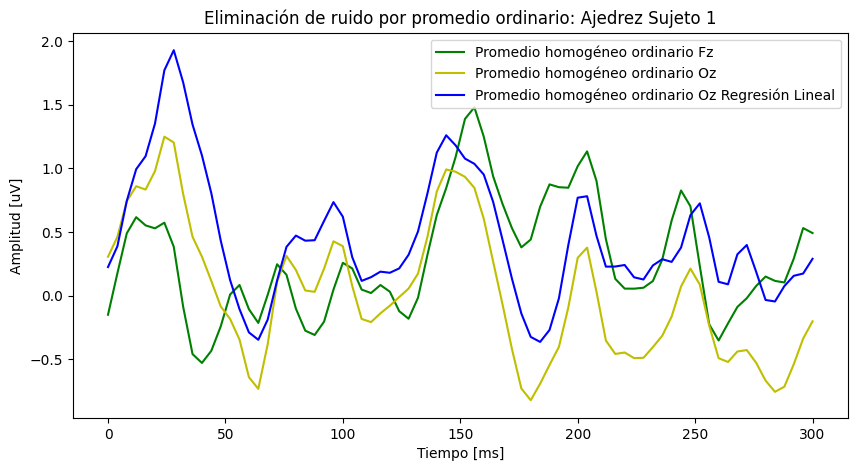

In [ ]:
time_r = [(x/250)*1000 for x in range(76)] #tiempo a graficar

s_Fz1 , _ = prom_homo(pe_Fz_p1)
s_Oz1 , _ = prom_homo(pe_Oz_p1)

#Reducción del ruido con filtro óptimo y procesado
regre1 = regresion_lineal(prom1,senales_chess['Oz_p1'])
pe_r1, _, _ = array_a_realizaciones(regre1,marcadores1)
prom1_r, _ = prom_homo(pe_r1)

#Gráfico
plt.figure(figsize=(10,5))
plt.plot(time_r, s_Fz1, 'g', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, s_Oz1, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.plot(time_r, prom1_r, 'b', label = 'Promedio homogéneo ordinario Oz Regresión Lineal')
plt.title('Eliminación de ruido por promedio ordinario: Ajedrez Sujeto 1')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()

Los canales Fz y Oz muestran información muy parecida.

Se puede notar una diferencia entre las señales filtradas con el filtro adapatativo y con la regresión lineal, pero los resultados tienen la misma tendencia. Para ver la comparación entre estos dos tipos de filtrado para el resto de los sujetos con esta técnica dirigirse a *Anexo. 4 - Procesamiento*.

**Sujeto 2**

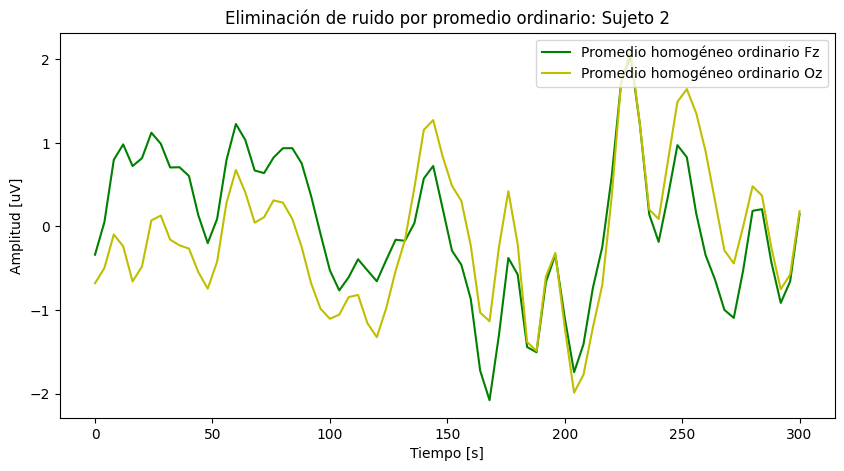

In [ ]:
s_Fz2, _= prom_homo(pe_Fz_p2)
s_Oz2, _ = prom_homo(pe_Oz_p2)

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Fz2, 'g', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, s_Oz2, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio ordinario: Sujeto 2')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [s]')
plt.legend(loc = 'upper right')
plt.show()

Nuevamente, la información de Oz y Fz es muy parecida.

**Sujeto 1** (ajedrez rojo y verde)

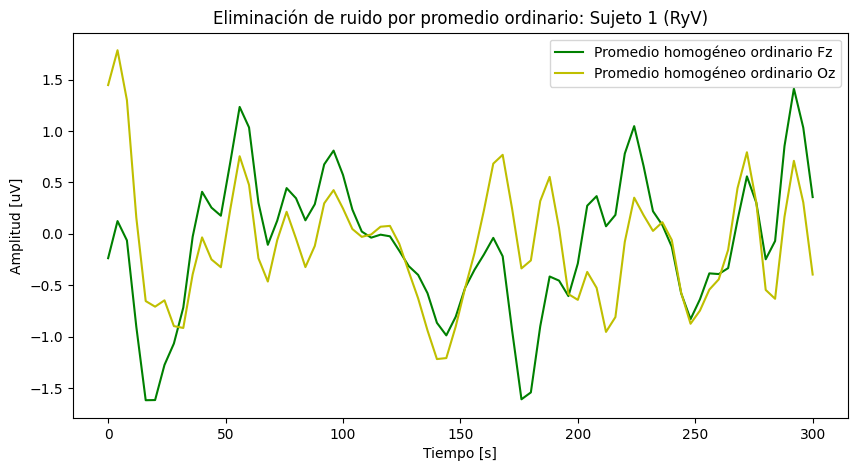

In [ ]:
s_Fz3 , _ = prom_homo(pe_Fz_p3)
s_Oz3 , _ = prom_homo(pe_Oz_p3)

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Fz3, 'g', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, s_Oz3, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio ordinario: Sujeto 1 (RyV)')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [s]')
plt.legend(loc = 'upper right')
plt.show()

Nuvamente Oz y Pz son muy parecidos.

#####Flash

**Sujeto 1**

76
76


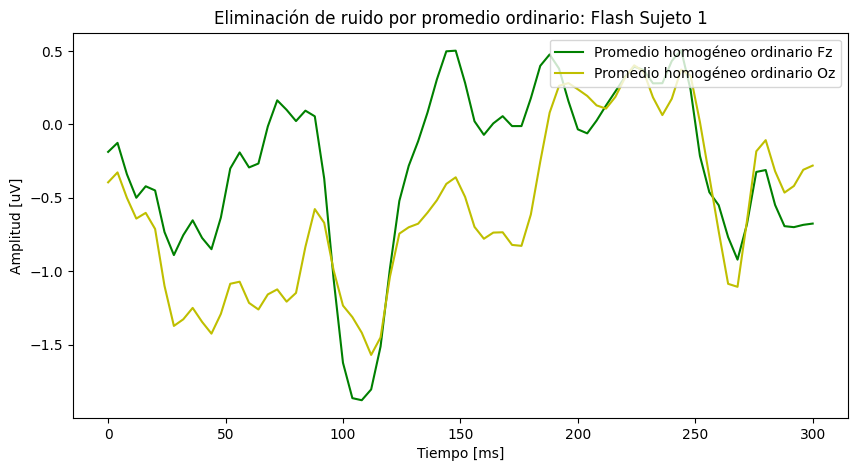

In [ ]:
s_Fz1_f , _ = prom_homo(pe_Fz_p1_f)
s_Oz1_f , _ = prom_homo(pe_Oz_p1_f)

time_r = [(x/250)*1000 for x in range(76)] #tiempo a graficar

print(len(s_Fz1_f))
print(len(s_Oz1_f))

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Fz1_f, 'g', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, s_Oz1_f, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio ordinario: Flash Sujeto 1')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()

**Sujeto 2**

76
76


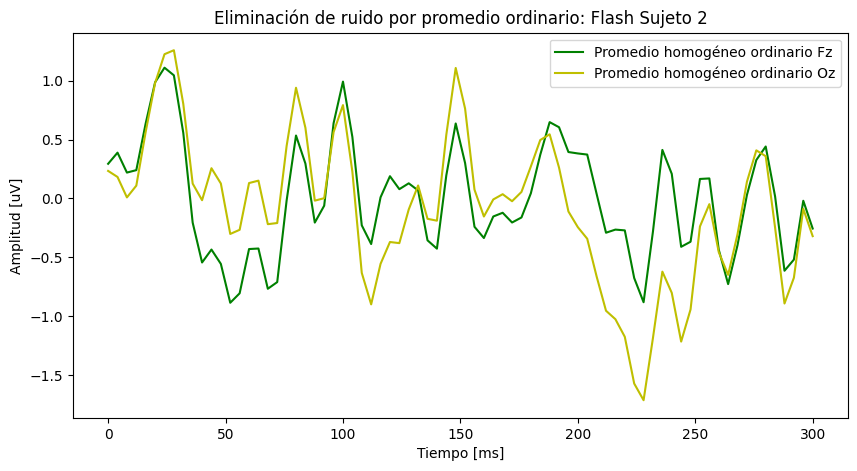

In [ ]:
s_Fz2_f , _ = prom_homo(pe_Fz_p2_f)
s_Oz2_f , _ = prom_homo(pe_Oz_p2_f)

time_r = [(x/250)*1000 for x in range(76)] #tiempo a graficar

print(len(s_Fz2_f))
print(len(s_Oz2_f))

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Fz2_f, 'g', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, s_Oz2_f, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio ordinario: Flash Sujeto 2')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()

####4.1.2 - Exponencial

In [ ]:
def prom_exp(pe):
  N = pe.shape[0]

  s_0 = pe[0,:] #Primer realizacion es el primer promedio

  v_0 = np.zeros([1,N])

  for i in range(1,N):
    s_0 = (i*s_0 + pe[i,:])/(i+1) # Formula para actualizar el promedio
    v_0[0,i] = np.var(s_0)

  return s_0, v_0

#####Tablero de ajedrez

**Sujeto 1**

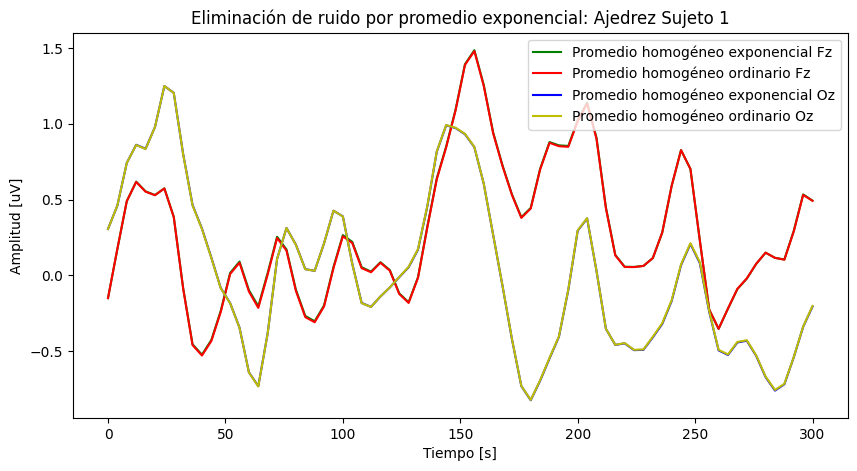

In [ ]:
exp_Fz1 , _ = prom_exp(pe_Fz_p1)
exp_Oz1 , _ = prom_exp(pe_Oz_p1)

plt.figure(figsize=(10,5))
plt.plot(time_r, exp_Fz1, 'g', label = 'Promedio homogéneo exponencial Fz')
plt.plot(time_r, s_Fz1, 'r', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, exp_Oz1, 'b', label = 'Promedio homogéneo exponencial Oz')
plt.plot(time_r, s_Oz1, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio exponencial: Ajedrez Sujeto 1')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper right')
plt.show()

Podemos ver que los dos tipos de promedios ordinarios son prácticamente idénticos tanto en Oz y Fz.

**Sujeto 2**

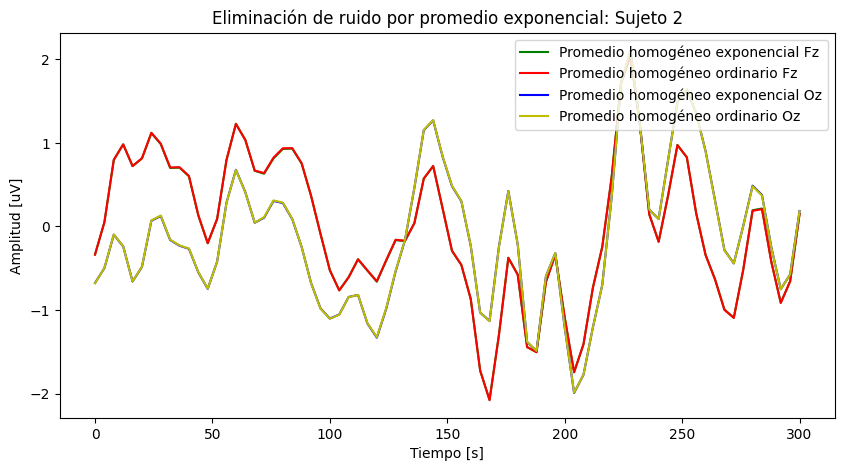

In [ ]:
exp_Fz2 , _ = prom_exp(pe_Fz_p2)
exp_Oz2 , _ = prom_exp(pe_Oz_p2)

plt.figure(figsize=(10,5))
plt.plot(time_r, exp_Fz2, 'g', label = 'Promedio homogéneo exponencial Fz')
plt.plot(time_r, s_Fz2, 'r', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, exp_Oz2, 'b', label = 'Promedio homogéneo exponencial Oz')
plt.plot(time_r, s_Oz2, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio exponencial: Sujeto 2')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper right')
plt.show()

**Sujeto 1** (tablero rojo y verde)

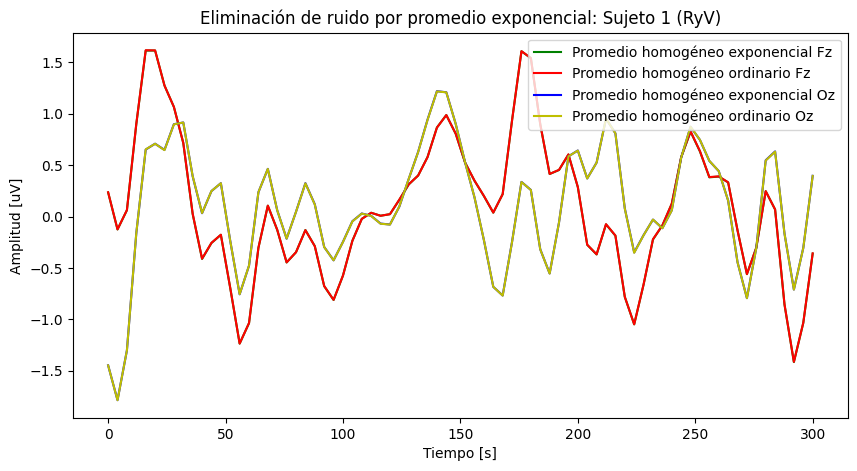

In [ ]:
exp_Fz3 , _ = prom_exp(pe_Fz_p3)
exp_Oz3 , _ = prom_exp(pe_Oz_p3)

plt.figure(figsize=(10,5))
plt.plot(time_r, -exp_Fz3, 'g', label = 'Promedio homogéneo exponencial Fz')
plt.plot(time_r, -s_Fz3, 'r', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, -exp_Oz3, 'b', label = 'Promedio homogéneo exponencial Oz')
plt.plot(time_r, -s_Oz3, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio exponencial: Sujeto 1 (RyV)')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper right')
plt.show()

#####Flash

**Sujeto 1**

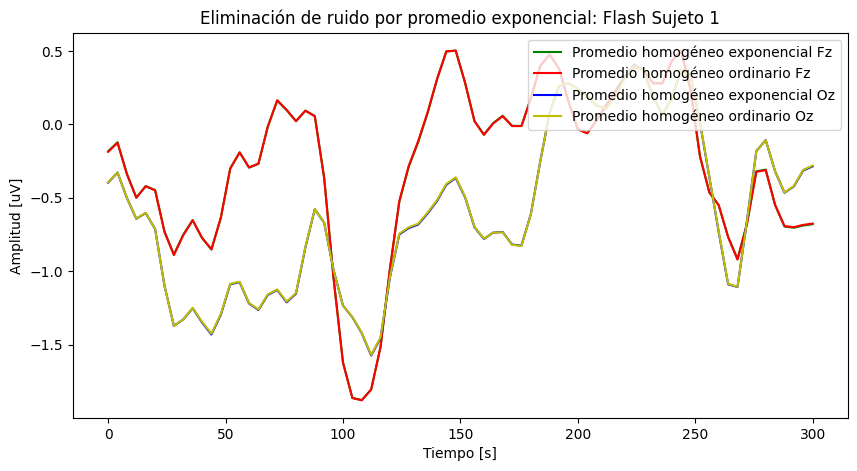

In [ ]:
exp_Fz1_f , _ = prom_exp(pe_Fz_p1_f)
exp_Oz1_f , _ = prom_exp(pe_Oz_p1_f)

plt.figure(figsize=(10,5))
plt.plot(time_r, exp_Fz1_f, 'g', label = 'Promedio homogéneo exponencial Fz')
plt.plot(time_r, s_Fz1_f, 'r', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, exp_Oz1_f, 'b', label = 'Promedio homogéneo exponencial Oz')
plt.plot(time_r, s_Oz1_f, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio exponencial: Flash Sujeto 1')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper right')
plt.show()

**Sujeto 2**

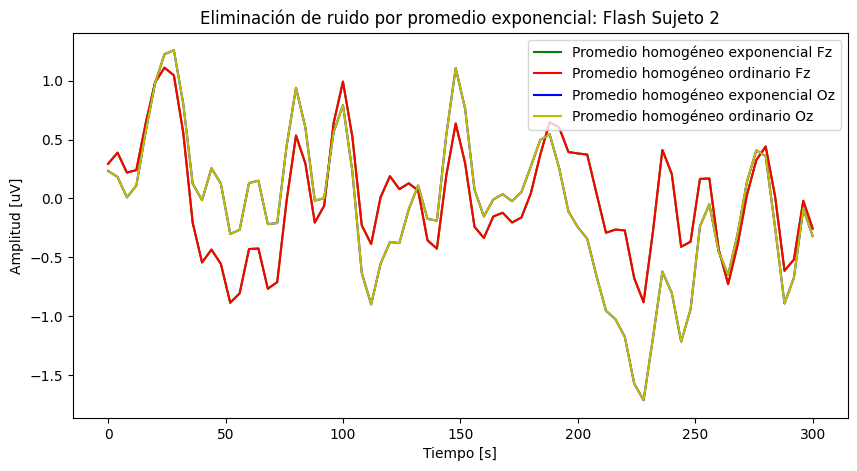

In [ ]:
exp_Fz2_f , _ = prom_exp(pe_Fz_p2_f)
exp_Oz2_f , _ = prom_exp(pe_Oz_p2_f)

plt.figure(figsize=(10,5))
plt.plot(time_r, exp_Fz2_f, 'g', label = 'Promedio homogéneo exponencial Fz')
plt.plot(time_r, s_Fz2_f, 'r', label = 'Promedio homogéneo ordinario Fz')
plt.plot(time_r, exp_Oz2_f, 'b', label = 'Promedio homogéneo exponencial Oz')
plt.plot(time_r, s_Oz2_f, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.title('Eliminación de ruido por promedio exponencial: Flash Sujeto 2')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [s]')
plt.legend(loc='upper right')
plt.show()

Como se puede observar, el efecto del promedio homogéneo ordinario y exponencial es practicamente idéntico para todos los sujetos.

Además, se observa que la derivación Oz (occipital) nos da varios picos que pueden ser relacionados con los potenciales evocados. La derivación Fz (frontal) tiene la misma tendencia que Oz. El procedimiento estándar para detectar PEV utiliza el electrodo Oz [4]. Esto se debe corteza visual está en la zona occipital de la cabeza, por lo que es probable que la información llegue a Fz con menos amplitud y más ruido. En este caso, se ve que la información de Fz muy parecida a la de Oz y, por ende, redundante. Por estos motivos, de aquí en adelante, solo tiene en cuenta el canal Oz.

###4.2 - Promedio inhomogéneo

En esta sección se comparan los distintos tipos de promedio inhomogéneo con el promedio homogéneo ordinario. No se compara con el exponencial por motivos prácticos ya que, como se vio antes, es prácticamente idéntico al ordinario. Además, se consideró solo la derivación Oz.

####4.2.1 - S variable

In [ ]:
def inhom_s(señal):
  # Estimo las amplitudes de los PEs en cada realizacion (a)
  s = np.mean(señal, axis = 0)
  s_t = np.transpose(s)
  a = señal.dot(s_t)
  a_t = np.transpose(a)

  # Calculo los pesos del promedio ponderado para el Caso 1
  w = a/(a_t.dot(a))
  w_t = np.transpose(w)

  # Estimo el promedio inhomogeneo
  prom = w_t.dot(señal/np.sum(w))

  return prom

#####Tablero de ajedrez

**Sujeto 1**

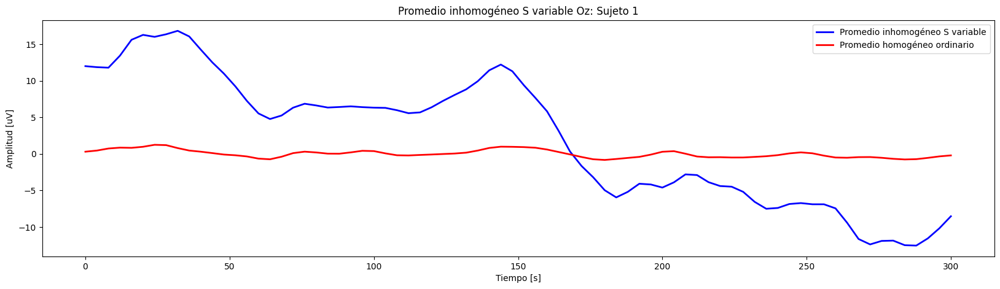

In [ ]:
s_inhom1 = inhom_s(pe_Oz_p1)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom1, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, s_Oz1,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

Hay una gran diferencia de amplitud entre ambas técnicas. La relación es aproximadamente 1:8. Como interesa analizar la forma de onda, se escaló el promedio ordinario para hacer más fácil la comparación.

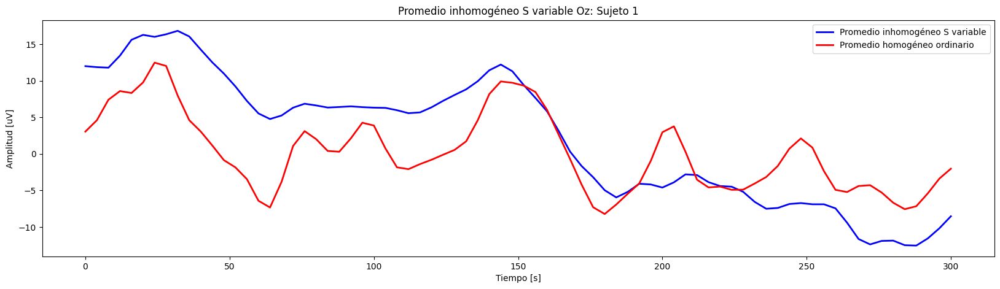

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom1, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, 10*s_Oz1,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

La tendencia es muy parecida, aunque el promedio homogéneo parece caracterizar mejor el PEV.

**Sujeto 2**

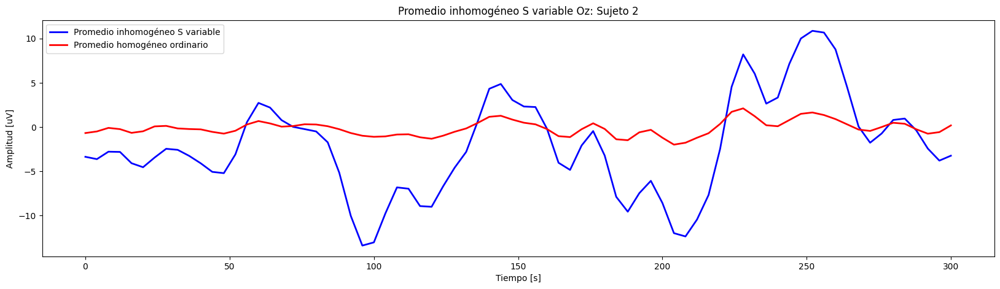

In [ ]:
s_inhom2 = inhom_s(pe_Oz_p2)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom2, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, s_Oz2,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

Ocurre lo mismo que en el caso anterior con la amplitud.

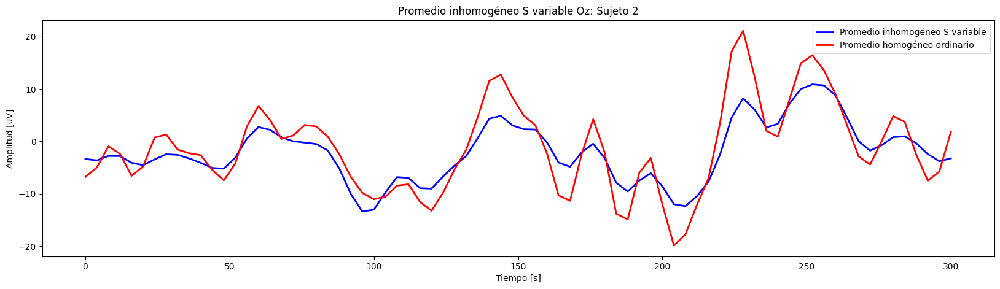

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom2, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, 10*s_Oz2,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 1** (tablero rojo y verde)

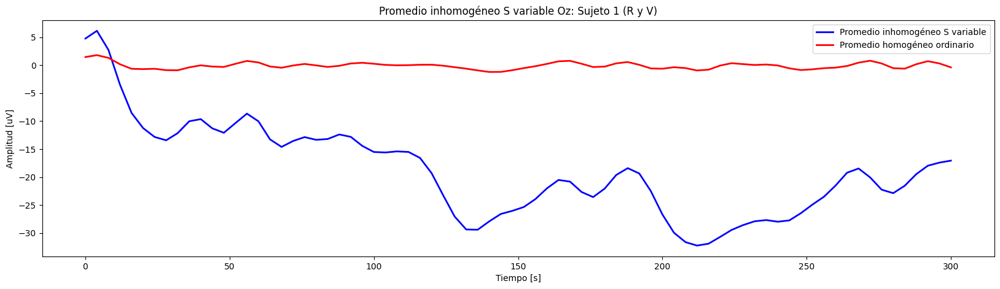

In [ ]:
s_inhom3 = inhom_s(pe_Oz_p3)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom3, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, s_Oz3,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 1 (R y V)')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

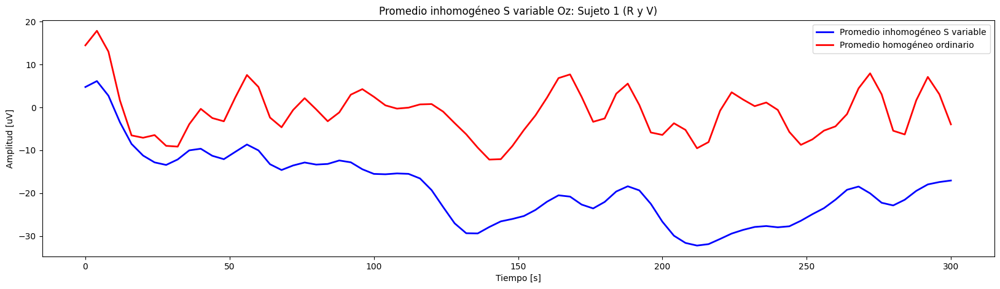

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom3, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, 10*s_Oz3,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 1 (R y V)')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
#plt.xlim((80,300))
plt.legend()
plt.show()

#####Flash

**Sujeto 1**

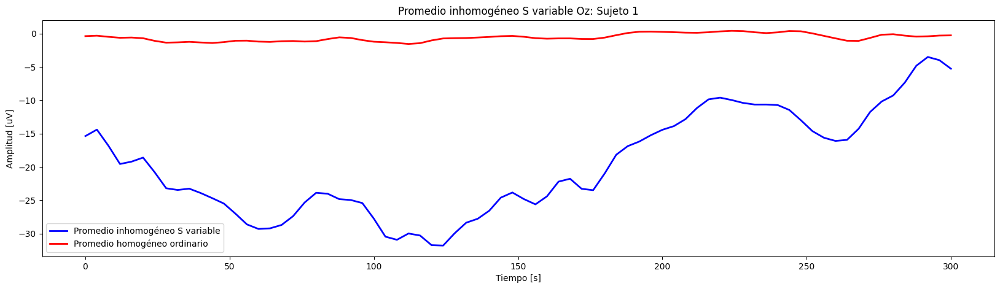

In [ ]:
s_inhom1_f = inhom_s(pe_Oz_p1_f)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom1_f, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, s_Oz1_f,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

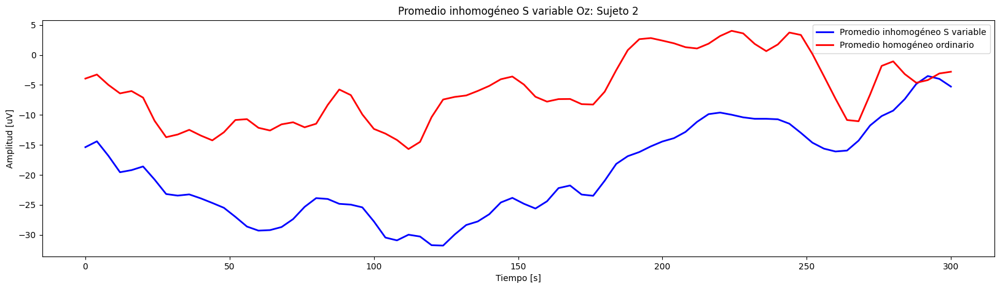

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom1_f, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, 10*s_Oz1_f,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 2**

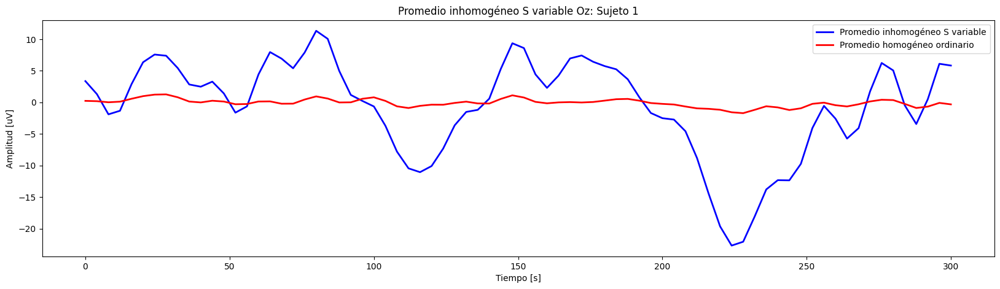

In [ ]:
s_inhom2_f = inhom_s(pe_Oz_p2_f)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom2_f, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, s_Oz2_f,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

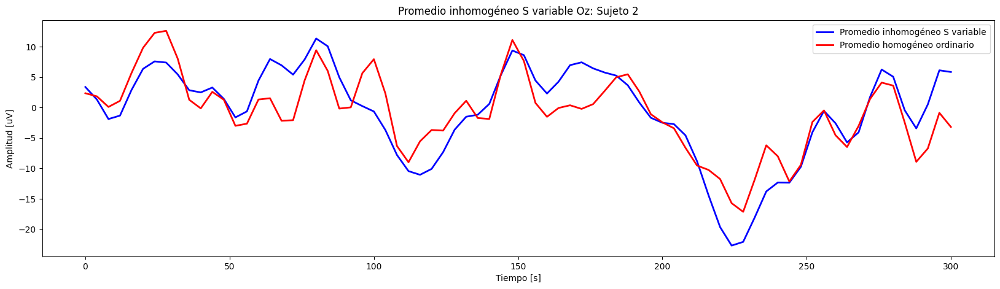

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom2_f, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, 10*s_Oz2_f,'r', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S variable Oz: Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

En general, se puede concluir que, más allá de la amplitud, la tendencia de las ondas obtenidas con el método de promedio inhomogéneo invariable con amplitud variable da resultados muy parecidos al del promedio homogéneo ordinario.

No obstante, la amplitud de los resultados obtenidos con el promedio homogéneo se acerca más a los ordenes de magnitud esperados para los potenciales evocados visuales [1][2][3].

####4.2.2 - V variable

In [ ]:
def inhom_v(señal):
  M = señal.shape[0]
  V = np.zeros([M,1])

  # Estimo la varianza del ruido
  for i in range(0,M):
    V[i] = np.var(señal[i,:])

  V_1 = 1/V
  suma = np.sum(V_1)

  # Obtengo los pesos del promedio ponderado
  w = (1/suma)*(V_1)
  w_t = np.transpose(w)

  # Estimo el promedio inhomogeneo
  prom = w_t.dot(señal)
  prom = np.transpose(prom)

  return prom

#####Tablero de ajedrez

**Sujeto 1**

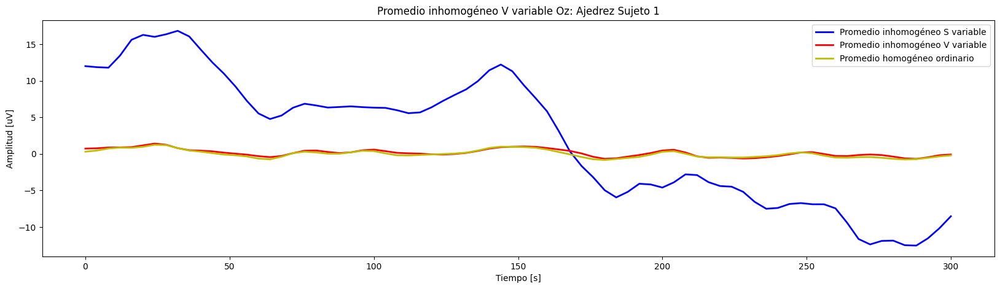

In [ ]:
v_inhom1 = inhom_v(pe_Oz_p1)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, s_inhom1, 'b', linewidth = 2, label='Promedio inhomogéneo S variable')
plt.plot(time_r, v_inhom1, 'r', linewidth = 2, label='Promedio inhomogéneo V variable')
plt.plot(time_r, s_Oz1,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo V variable Oz: Ajedrez Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

El promedio inhomogéneo con varianza variable da mucho más parecido (en amplitud) al promedio homogéneo que el de amplitud variable. Se grafican solo el promedio inhomogéneo con varianza variable con el promedio homogéneo ordinario.

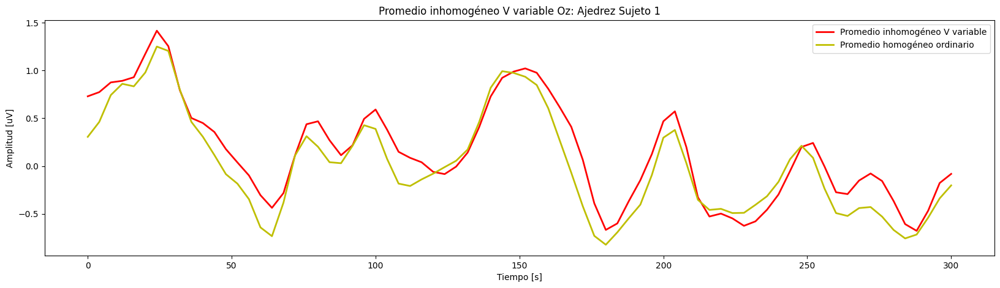

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, v_inhom1, 'r', linewidth = 2, label='Promedio inhomogéneo V variable')
plt.plot(time_r, s_Oz1,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo V variable Oz: Ajedrez Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

Los resultados son muy parecidos. Por el momento, se descarta la comparación con el promedio inhomogéneo con amplitud variable.

**Sujeto 2**

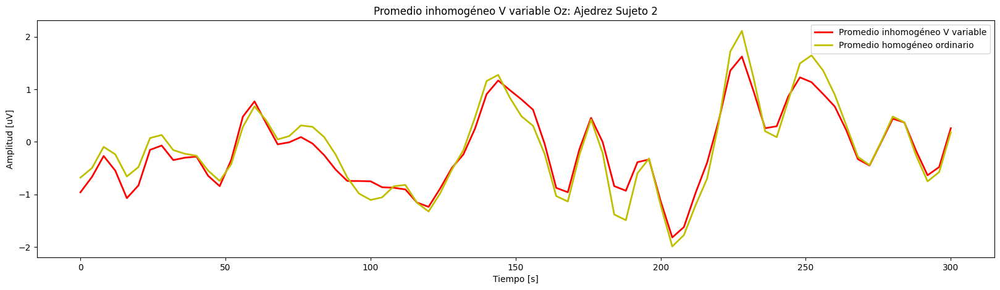

In [ ]:
v_inhom2 = inhom_v(pe_Oz_p2)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, v_inhom2, 'r', linewidth = 2, label='Promedio inhomogéneo V variable')
plt.plot(time_r, s_Oz2,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo V variable Oz: Ajedrez Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

Nuevamente, los resultados son muy parecidos.

**Sujeto 1** (tablero de ajedrez)

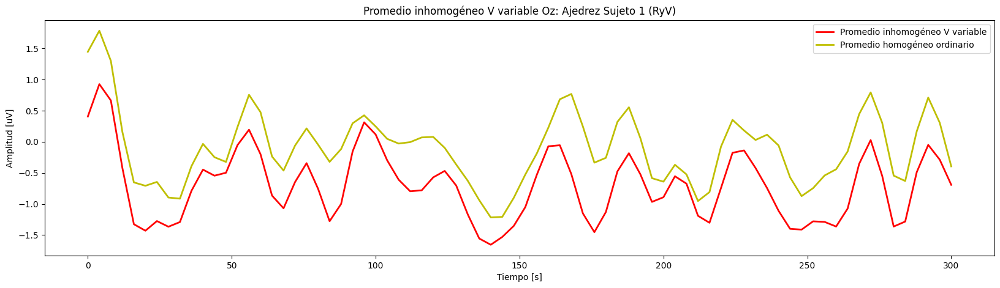

In [ ]:
v_inhom3 = inhom_v(pe_Oz_p3)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, v_inhom3-0.8, 'r', linewidth = 2, label='Promedio inhomogéneo V variable')
plt.plot(time_r, s_Oz3,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo V variable Oz: Ajedrez Sujeto 1 (RyV)')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

#####Flash

**Sujeto 1**

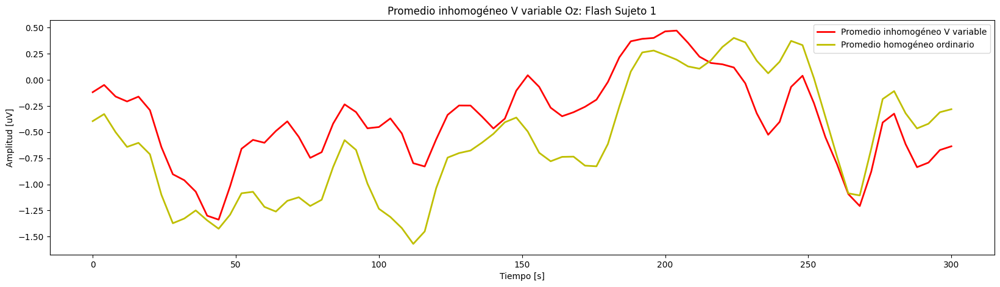

In [ ]:
v_inhom1_f = inhom_v(pe_Oz_p1_f)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, v_inhom1_f, 'r', linewidth = 2, label='Promedio inhomogéneo V variable')
plt.plot(time_r, s_Oz1_f,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo V variable Oz: Flash Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 2**

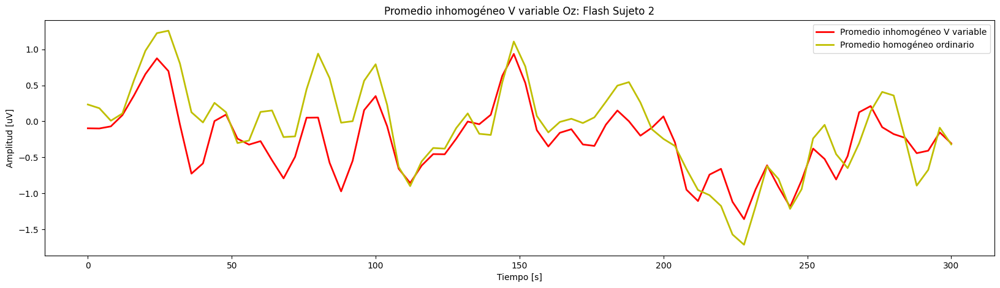

In [ ]:
v_inhom2_f = inhom_v(pe_Oz_p2_f)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, v_inhom2_f, 'r', linewidth = 2, label='Promedio inhomogéneo V variable')
plt.plot(time_r, s_Oz2_f,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo V variable Oz: Flash Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

En conclusión, se puede ver que el promedio inhomogéneo con varianza variable es mucho más exacto que el de amplitud variable en cuanto amplitud y tendencia, es decir que "calca" casi perfectamente a lo que fue calculado con el promedio homogéneo ordinario.

####4.2.3 - S y V variables

En esta sección, los gráficos se comparan solo con los del promedio homogéneo variable ya que, como se vio antes, el promedio inhomogéneo con amplitud variable no respeta la magnitud de la señal y el de varianza variable es muy parecido al homogéneo.

In [ ]:
def inhom_sv(señal):
  M = señal.shape[0]
  V = np.zeros([M,1])

  # Estimo la varianza del ruido
  for i in range(0,M):
    V[i] = np.var(señal[i,:])

  # Estimo las amplitudes de los PEs en cada realizacion (a)
  s = np.mean(señal, axis = 0)
  s_t = np.transpose(s)
  a = señal.dot(s_t)
  a_t = np.transpose(a)

  Rv_1a=[a_t[i]/(V[i]) for i in range(M)]
  atRv_1a=[(a[i]**2/V[i]) for i in range(M)]

  Rv_1a=np.asarray(Rv_1a)
  Rv_1a=Rv_1a[:,0]

  # Calculo los pesos del promedio ponderado para el caso
  w = (1/np.sum(atRv_1a))*Rv_1a
  w_t = np.transpose(w)

  # Estimo el promedio inhomogeneo
  prom = w_t.dot(señal)

  return prom

#####Tablero de ajedrez

**Sujeto 1**

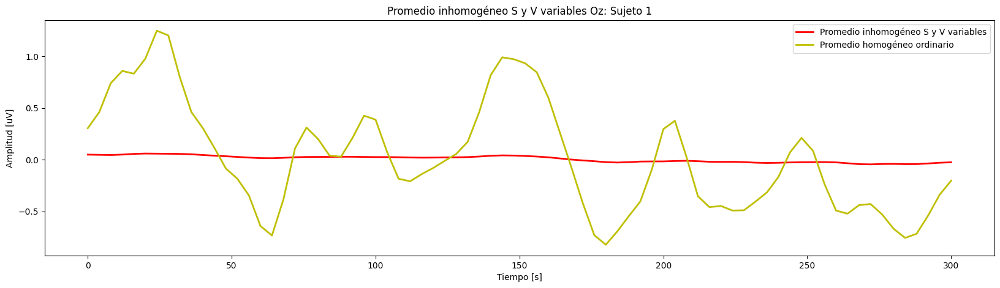

In [ ]:
sv_inhom1 = inhom_sv(pe_Oz_p1)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, sv_inhom1, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz1,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

La amplitud disminuye mucho con respecto al promedio homogéneo ordinario. Sin embargo, la tendencia es muy parecida. Esto se puede ver en el siguiente gráfico:

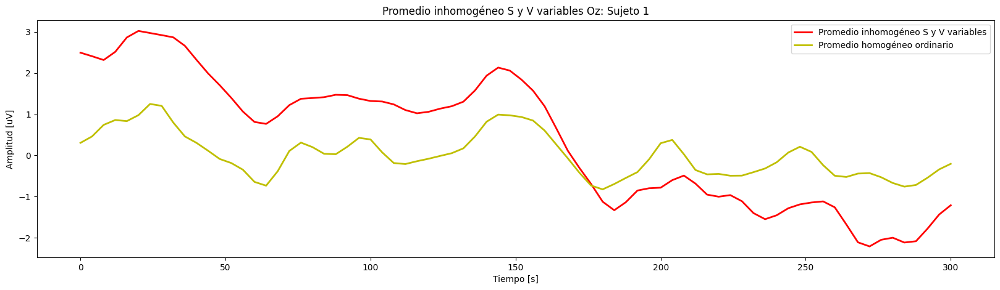

In [ ]:
# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, 50*sv_inhom1, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz1,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 2**

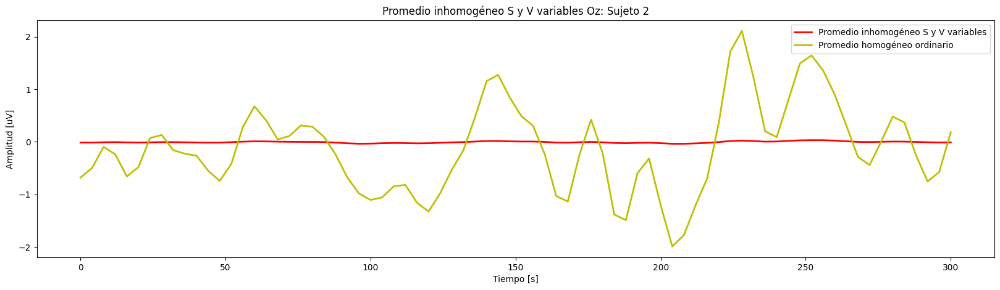

In [ ]:
sv_inhom2 = inhom_sv(pe_Oz_p2)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, sv_inhom2, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz2,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

Ocurre lo mismo que en el caso anterior

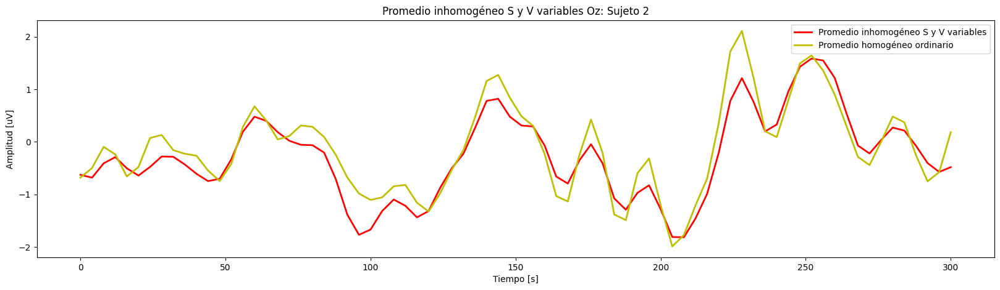

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, 50*sv_inhom2, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz2,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 1** (tablero rojo y verde)

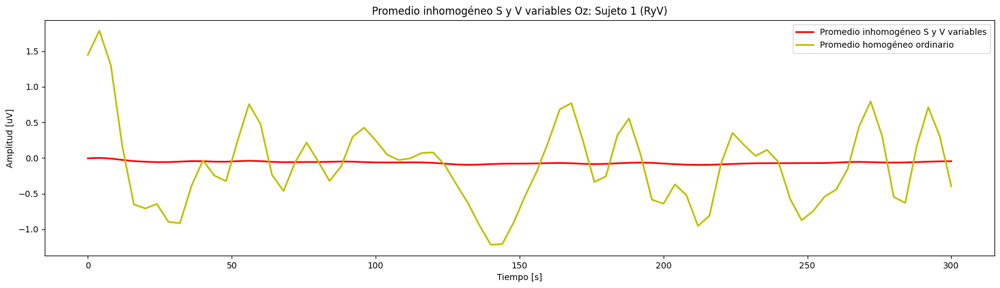

In [ ]:
sv_inhom3 = inhom_sv(pe_Oz_p3)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, sv_inhom3, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz3,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Sujeto 1 (RyV)')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

Ajustando la amplitud y el offset, las tendencias son parecidas.

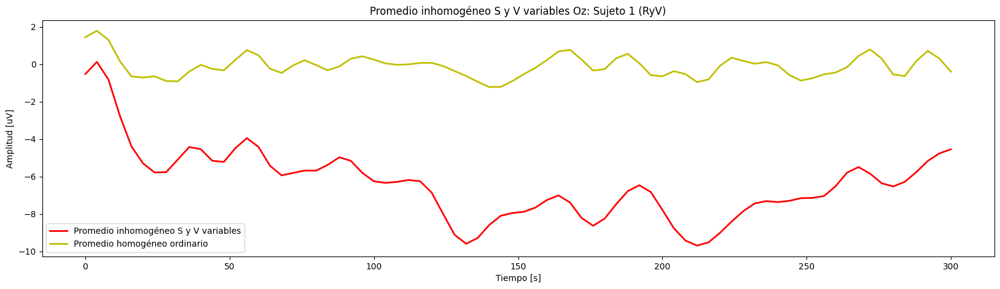

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, 100*sv_inhom3, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz3,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Sujeto 1 (RyV)')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

#####Flash

**Sujeto 1**

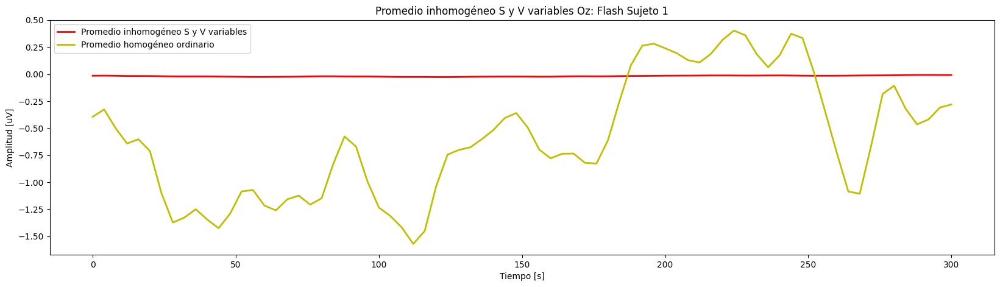

In [ ]:
sv_inhom1_f = inhom_sv(pe_Oz_p1_f)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, sv_inhom1_f, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz1_f,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Flash Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

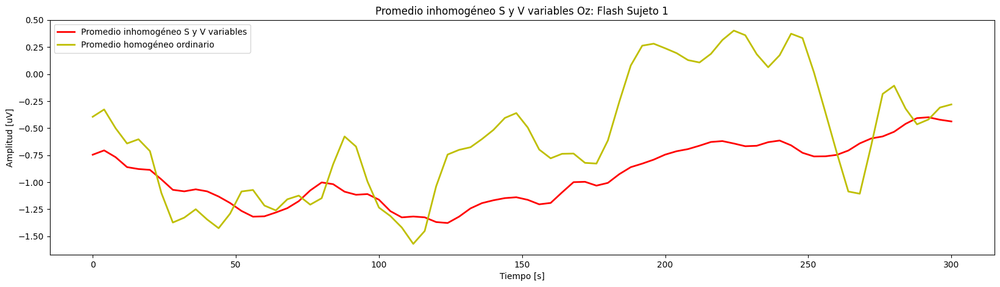

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, 50*sv_inhom1_f, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz1_f,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Flash Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 2**

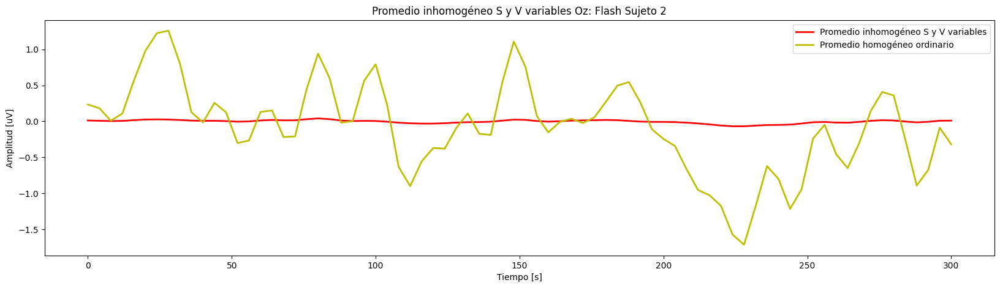

In [ ]:
sv_inhom2_f = inhom_sv(pe_Oz_p2_f)

# Grafico
plt.figure(figsize = (20,5))
plt.plot(time_r, sv_inhom2_f, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz2_f,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Flash Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

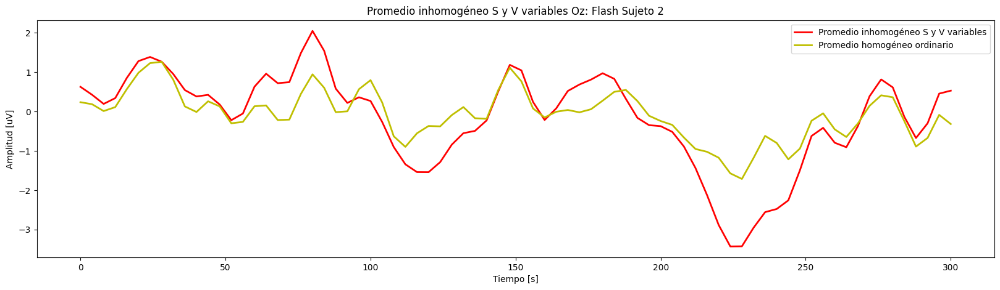

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(time_r, 50*sv_inhom2_f, 'r', linewidth = 2, label='Promedio inhomogéneo S y V variables')
plt.plot(time_r, s_Oz2_f,'y', linewidth = 2, label='Promedio homogéneo ordinario')
plt.title('Promedio inhomogéneo S y V variables Oz: Flash Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

####4.2.4 - Conclusiones

Podemos concluir que todas las técnicas performan bastante parecido. La mayor diferencia viene dada por la amplitud: el el promedio inhomogéneo con amplitud variable maneja resultados en la década del uV y, el inhomogéneo de amplitud y varianza variables, en la décima del uV.

El resto de las técnicas muestran magnitudes del orden del uV y tienen tendencias muy parecidas. Dado que son mayoría y que se encuentran a la mitad del espectro de magnitudes obtenidas con todas las técnica, se tomó como referencia el promedio homogéneo ordinario para el posterior análisis.

La otra técnica que performa muy bien es la inhomogénea de varianza variable, que es muy parecida en forma y magnitud al promedio homogéneo. Que estas dos técnicas sean las más precisas tiene sentido ya que se espera que la magnitud del PEV sea bastante conservada (mismas condiciones experimentales, mismo estímulo), mientras que su varianza puede llegar a ser un poco más variable (variaciones en el ruido, atención, etc).

Como se puede observar en *Anexo. 4 - Procesamiento* y teniendo en cuenta todo lo mencionado hasta el momento, el resultado con estas técnicas para los distintos tipos de filtrado es muy similar. Por esa razón, el resto del análisis se hará teniendo en cuenta las señales filtradas con el filtro óptimo, que es la técnica que se utilizó durante todo el curso.

##5 - Análisis de latencia

En esta sección se utilizan los resultados de los promedios homogéneos de los 5 experimentos para caracterizar las latencias de los potenciales evocados. La razón por la que se eligió esta técnica, y no el promedio inhomogéneo con varianza variable, es que es la técnica más sencilla y la que se suele usar cotidianamente para detectar los potenciales.

Para este análisis, resulta más conveniente trabajar con señales más suaves, ya que así se puede contrastar los resultados con la información teórica de manera más sencilla. Esto se puede lograr de dos formas: trabajando con más realizaciones o filtrando la señal para sólo quedarse con las frecuencias más bajas. Por lo tanto, se implementó un filtro basabandas tipo butterworth con frecuencia de corte 20Hz [5]. Para ello, se creó una función que vuelve a realizar todo el filtrado de la señal tal cual las secciones anteriores pero ahora con este nuevo pasabandas. En todos los casos, se utilizaron los mismos criterios para la elección de los hiperparámetros. Los gráficos del nuevo filtrado están acompañados de la señal que se vino utilizando hasta el momento para mayor claridad.

Los potenciales evocados obtenidos empíricamente se comparan con distinta bibliografía según la naturaleza del estudio:

* Los que se obtuvieron a partir del cambio de patrón del tablero de ajedrez normal con [1] y [2].

* El obtenido a partir del tablero de ajedrez rojo y verde con [3].

* Los obtenidos a partir del flash con [1].

In [ ]:
def envolvente(datos, tiempo):

  #Pasabajos (en realidad es el mismo pasabandas de antes pero en vez de cortar en 60Hz, corta en 20Hz)
  N = 5
  wn = [0.5,20]
  [b,a] = signal.butter(N, wn, btype = 'bandpass', fs = fs)
  EOGd = signal.lfilter(b,a,datos['Columna3'][100:])
  EOGi = signal.lfilter(b,a,datos['Columna5'][100:])
  filtrada = signal.lfilter(b,a,datos['Columna9'][100:])
  EOGd = EOGd[2000:]
  EOGi = EOGi[2000:]
  lp = filtrada[2000:]

  #Notch
  N = 4
  wn = [48,52] #Queremos eliminar el ruido de 50 Hz
  [b,a] = signal.butter(N, wn, btype = 'bandstop', fs = fs)
  EOGd = signal.lfilter(b,a,EOGd)
  EOGi = signal.lfilter(b,a,EOGi)
  bs = signal.lfilter(b,a,lp)

  #Promedio EOG
  EOG_prom = (EOGd + EOGi)/2

  #LMS
  L= 2**10 #orden del filtro
  Px = np.mean(bs**2) #aproximación de la potencia
  a=0.1
  mu = a*(1/(10*L*Px))
  f3 = lms(bs,EOG_prom,L,mu)
  error = sp.signal.lfilter(f3, 1, bs)
  op =  bs - error

  return op

###5.1 - Tablero de ajedrez convencional

Según [2], las latencias típicas para los potenciales evocados visuales causados por un patrón cambiante, como el ajedrez, son las que muestra la siguiente imagen:

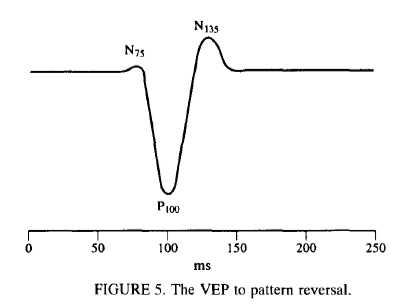

A continuación, se evalúa cuanto se asemejan los potenciales empíricos con esta información teórica.

**Sujeto 1**

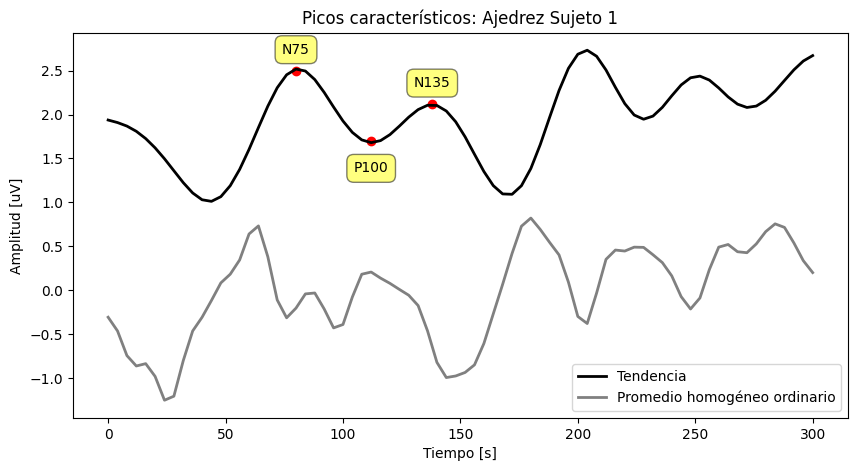

In [ ]:
pasabajos1 = envolvente(datos1,tiempo1)
pasabajos1 = pasabajos1[:new_len1]
pe1, _ , _ = array_a_realizaciones(pasabajos1,marcadores1)
env1, _ = prom_homo(pe1)

# Grafico
plt.figure(figsize = (10,5))
plt.plot(time_r, -env1+2, 'black', linewidth = 2, label='Tendencia')
plt.plot(time_r, -s_Oz1,'gray', linewidth = 2, label='Promedio homogéneo ordinario')
plt.scatter(80, 2.50, color='red')
plt.annotate('N75', (80, 2.5), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(112, 1.7, color='red')
plt.annotate('P100', (112, 1.15), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(138, 2.12, color='red')
plt.annotate('N135', (138, 2.12), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.title('Picos característicos: Ajedrez Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 2**

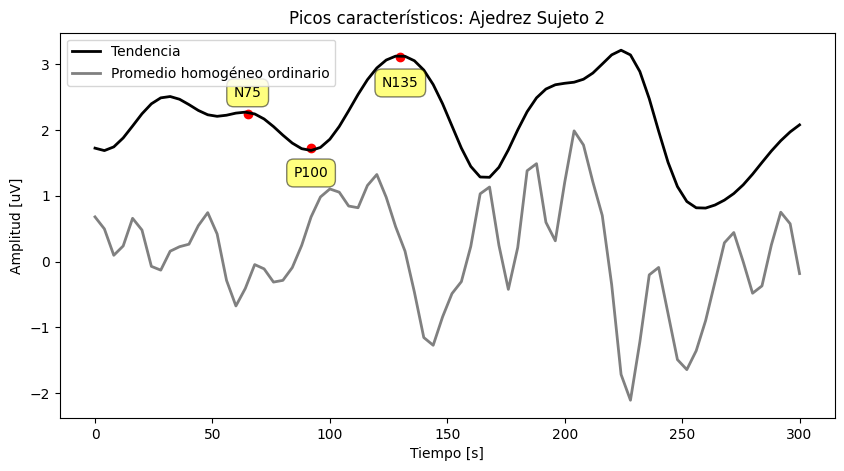

In [ ]:
Spasabajos2 = envolvente(datos2,tiempo2)
pasabajos2 = pasabajos2[:new_len2].tolist()
pe2, _ , _  = array_a_realizaciones(pasabajos2,marcadores2)
env2, _ = prom_homo(pe2)

# Grafico
plt.figure(figsize = (10,5))
plt.plot(time_r, -env2+2, 'black', linewidth = 2, label='Tendencia')
plt.plot(time_r, -s_Oz2,'gray', linewidth = 2, label='Promedio homogéneo ordinario')
plt.scatter(65, 2.25, color='red')
plt.annotate('N75', (65, 2.25), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(92, 1.73, color='red')
plt.annotate('P100', (92, 1.03), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(130, 3.12, color='red')
plt.annotate('N135', (130, 2.4), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.title('Picos característicos: Ajedrez Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Promedio entre ambos sujetos**

Esto se hace ya que los potenciales evocados deberían ser similares entre personas. Se evalúa si la información obtenida se asemeja más a la información brindada por la bibliografía.

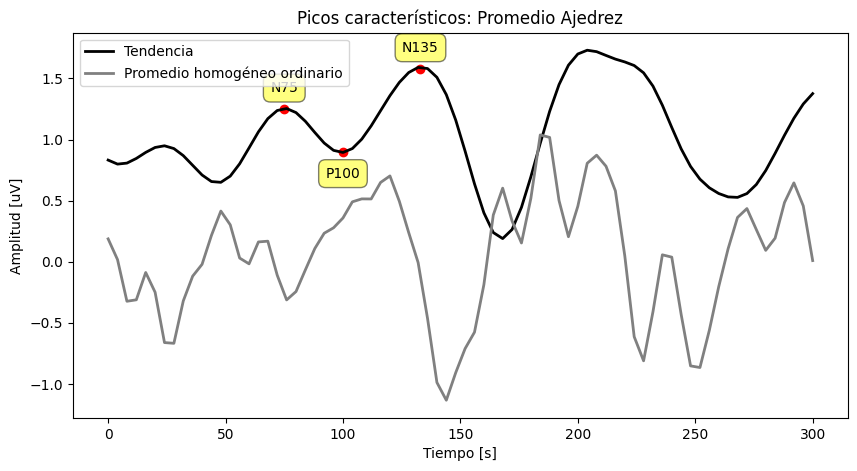

In [ ]:
prom_env = (env1 + env2) / 2
prom_sig = (s_Oz1 + s_Oz2) / 2

# Grafico
plt.figure(figsize = (10,5))
plt.plot(time_r, -prom_env+1, 'black', linewidth = 2, label='Tendencia')
plt.plot(time_r, -prom_sig,'gray', linewidth = 2, label='Promedio homogéneo ordinario')
plt.scatter(75, 1.25, color='red')
plt.annotate('N75', (75, 1.25), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(100, 0.9, color='red')
plt.annotate('P100', (100, 0.55), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(133, 1.58, color='red')
plt.annotate('N135', (133, 1.58), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.title('Picos característicos: Promedio Ajedrez')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Análisis de resultados**

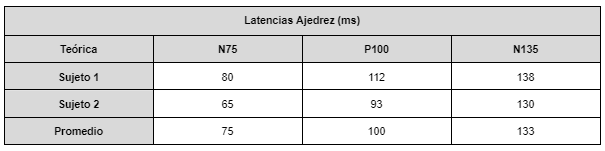

Como primer enfoque, se intentó encontrar en los resultados picos en las zonas donde se esperaba según la información obtenida de la bibliografía. Los gráficos, con sus respectivas etiquetas, y la tabla, se generaron siguiendo este criterio. Las señales debieron invertirse, ya que la bibliografía muestra las señales invertidas. Se pueden observar picos bastante cercanos a los esperados en ambos sujetos. P100, el más característico, está mejor logrado en el sujeto 2 (7% vs 12%). El resto de los resultados tienen dispersiones similares con respecto al estándar. Finalmente, al promediar ambos resultados, se logran unos valores todavía más cercanos a los esperados.

No obstante, la forma de onda generada por esos puntos no es tan parecida a la onda característica de los PEV que se puede apreciar en la imagen. Si nos movemos 50ms a la derecha, podemos encontrar un complejo mucho más parecido a lo que buscamos:

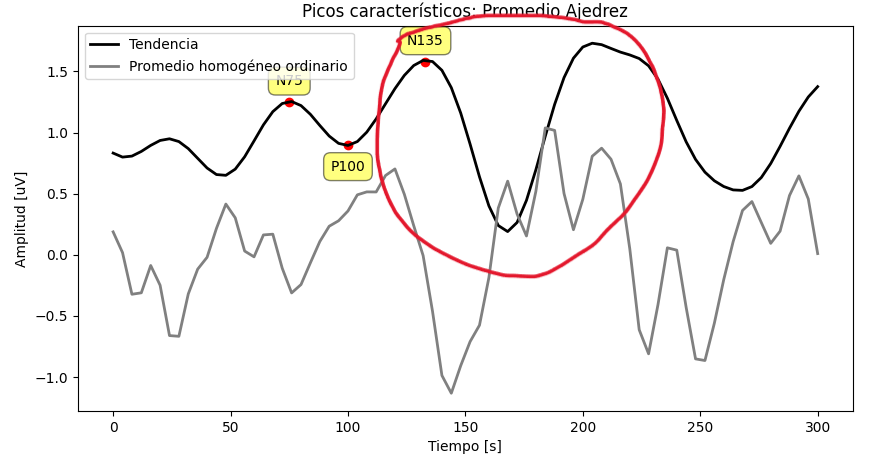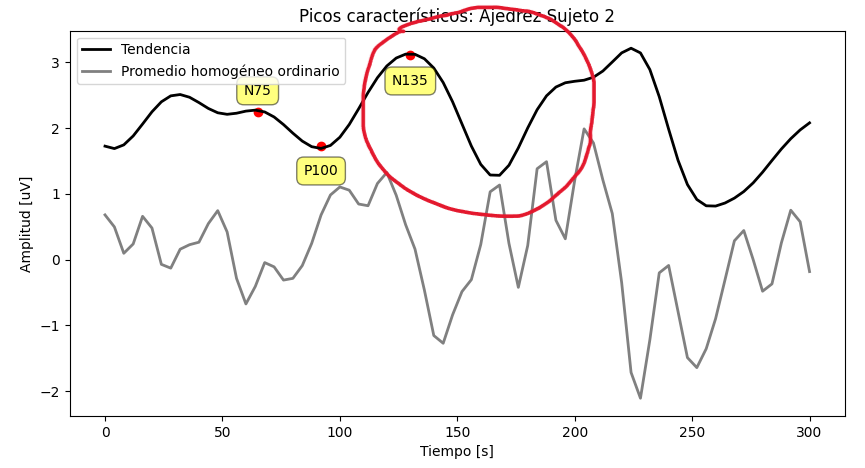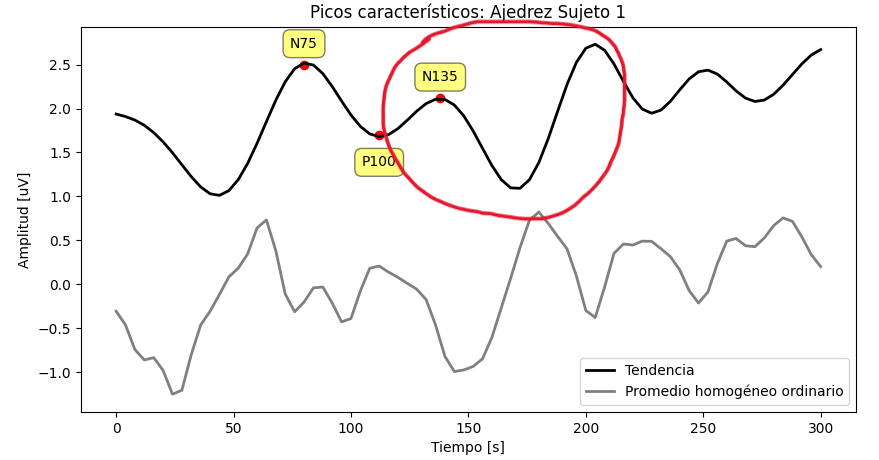

Sin embargo, no podemos relacionarlos directamente a los PEV debido a su gran latencia. Los PEV tienen una latencia bastante conservada, que suele verse modificada más que nada por edad o por algunas condiciones médicas. Aún así, no suelen variar más del 20% (aprox 20ms) [3][6] y las estructuras que se detectaron tienen un "corrimiento" de alrededor de 50ms con respecto al estándar. La única explicación plausible para poder relacionar estas estructuras con los PEV es algún tipo de retardo durante la toma de datos, o una descorrelación de los marcadores de estimulo con la información utilizada.

###5.2 - Tablero de ajedrez rojo y verde

Según [3], el potencial evocado esperado debería ser similar al del caso anterior. De la misma manera que antes, se pueden ubicar picos en la zona esperada, aunque la forma de onda sigue sin quedar muy definida.

**Sujeto 1**

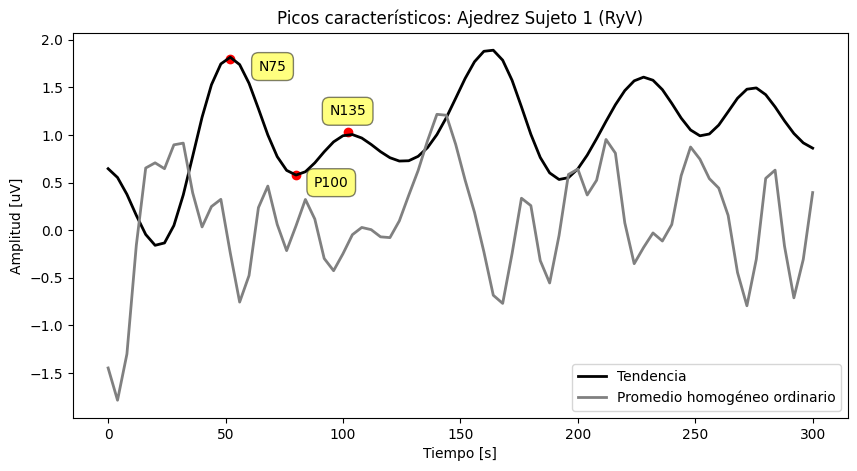

In [ ]:
pasabajos3 = envolvente(datos3,tiempo3)
pasabajos3 = pasabajos3[:new_len3].tolist()
pe3, _ , _  = array_a_realizaciones(pasabajos3,marcadores3)
env3, _ = prom_homo(pe3)

# Grafico
plt.figure(figsize = (10,5))
plt.plot(time_r, -env3+1, 'black', linewidth = 2, label='Tendencia')
plt.plot(time_r, -s_Oz3,'gray', linewidth = 2, label='Promedio homogéneo ordinario')
plt.scatter(52, 1.8, color='red')
plt.annotate('N75', (70, 1.5), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(80, 0.58, color='red')
plt.annotate('P100', (95, 0.28), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(102, 1.03, color='red')
plt.annotate('N135', (102, 1.03), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.title('Picos característicos: Ajedrez Sujeto 1 (RyV)')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

Se agrega este último resultado a la tabla anterior:

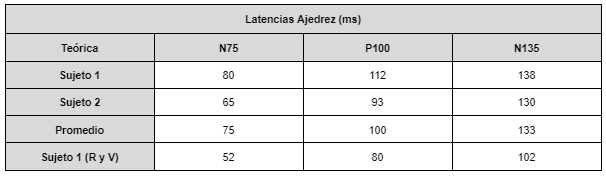

Este potencial evocado parece ser el peor de todos, tanto si se miran sus valores a simple vista como si se los compara con el otro resultado del sujeto 1 (debería ser muy similar). Esto puede encontrar explicación en que la frecuencia de estimulación en este caso fue de 4Hz (4 estimulos por segundo o 1 estímulo cada 250ms). Como se mencionó antes, los potenciales evocados tienen una duración típica de 300ms, pero también pueden durar más. Entonces, puede ser que al haber tan poco tiempo entre estimulos, la información de cada uno se vea afectado por la del anterior.


###5.3 - Flash

Según [2], los potenciales evocados visuales provocados por un flash son bastante distintos a los que provoca el cambio de patrón del tablero de ajedrez:

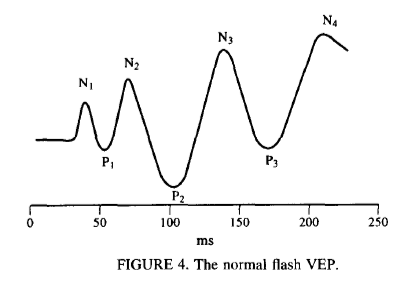

**Sujeto 1**

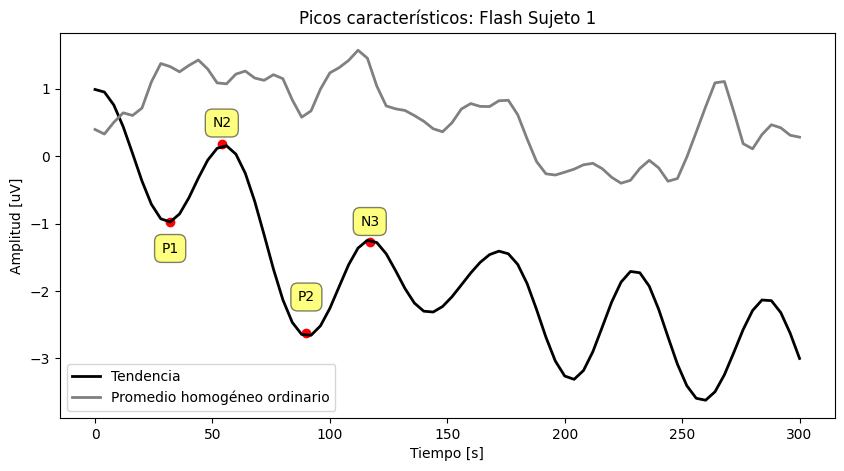

In [ ]:
pasabajos4 = envolvente(flash1,tiempof1)
pasabajos4 = pasabajos3[:new_len1_f]
pe4, _ , _  = array_a_realizaciones(pasabajos4,marcadores1_f)
env4, _ = prom_homo(pe4)

# Grafico
plt.figure(figsize = (10,5))
plt.plot(time_r, -env4, 'black', linewidth = 2, label='Tendencia')
plt.plot(time_r, -s_Oz1_f,'gray', linewidth = 2, label='Promedio homogéneo ordinario')
plt.scatter(32, -0.98, color='red')
plt.annotate('P1', (32, -1.68), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(54, 0.18, color='red')
plt.annotate('N2', (54, 0.18), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(90, -2.62, color='red')
plt.annotate('P2', (90, -2.4), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(117, -1.28, color='red')
plt.annotate('N3', (117, -1.28), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.title('Picos característicos: Flash Sujeto 1')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Sujeto 2**

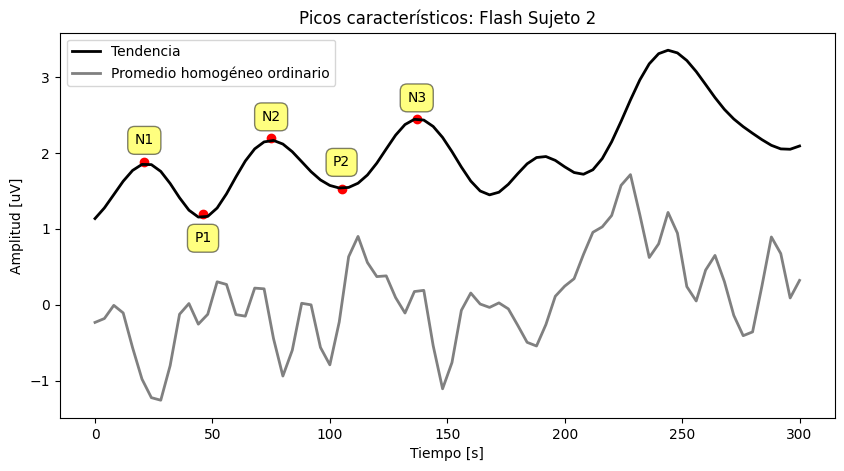

In [ ]:
pasabajos5 = envolvente(flash2,tiempof2)
pasabajos5 = pasabajos5[:new_len2_f]
pe5, _ , _  = array_a_realizaciones(pasabajos5,marcadores2_f)
env5, _ = prom_homo(pe5)

# Grafico
plt.figure(figsize = (10,5))
plt.plot(time_r, -env5+2, 'black', linewidth = 2, label='Tendencia')
plt.plot(time_r, -s_Oz2_f,'gray', linewidth = 2, label='Promedio homogéneo ordinario')
plt.scatter(21, 1.88, color='red')
plt.annotate('N1', (21, 1.89), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(46, 1.19, color='red')
plt.annotate('P1', (46, 0.6), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(75, 2.2, color='red')
plt.annotate('N2', (75, 2.2), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(105, 1.52, color='red')
plt.annotate('P2', (105, 1.6), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(137, 2.45, color='red')
plt.annotate('N3', (137, 2.45), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.title('Picos característicos: Flash Sujeto 2')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Promedio entre los dos sujetos**

Utilizando la misma lógica que con el tablero de ajedrez, se promedian ambos potenciales evocados para comparar con lo esperado teoricamente.

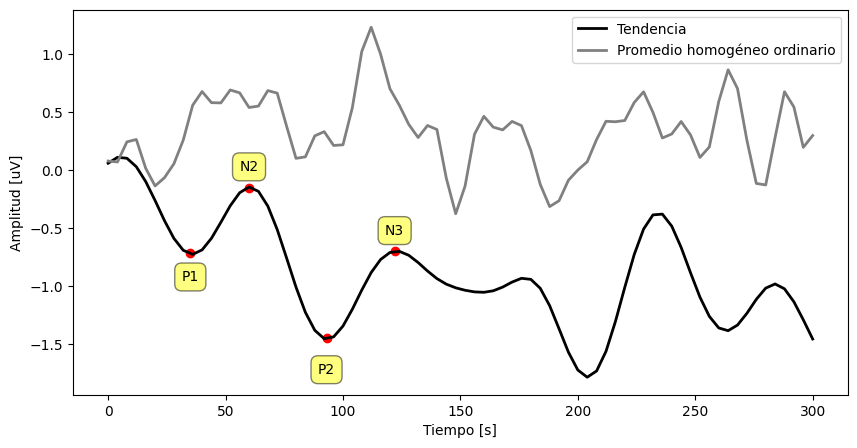

In [ ]:
prom_env_f = (env4 + env5) / 2
prom_sig_f = (s_Oz1_f + s_Oz2_f) / 2

# Grafico
plt.figure(figsize = (10,5))
plt.plot(time_r, -prom_env_f, 'black', linewidth = 2, label='Tendencia')
plt.plot(time_r, -prom_sig_f,'gray', linewidth = 2, label='Promedio homogéneo ordinario')
plt.scatter(35, -0.71, color='red')
plt.annotate('P1', (35, -1.1), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(60, -0.15, color='red')
plt.annotate('N2', (60, -0.15), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(93, -1.45, color='red')
plt.annotate('P2', (93, -1.9), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.scatter(122, -0.70, color='red')
plt.annotate('N3', (122, -0.70), xytext=(0, 10), textcoords='offset points', ha='center', va='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.legend()
plt.show()

**Análisis de resultados**

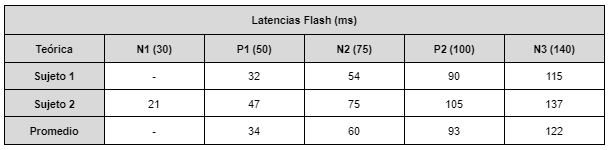

El primero de los resultados es bastante distinto a lo esperado. En primer lugar, no cuenta con el pico N1, pero, además, difiere bastante en las latencias con el PEV estándar. Por otra parte, el PEV estándar cuenta con una tendencia claramente ascendente, mientras que el resultado para el primer sujeto es descendiente. Todo esto resulta llamativo, por lo que es probable que haya habido un error durante la toma de datos o durante el procesamiento de los mismos.

El segundo resultado es muy parecido al estándar, tanto en su tendencia ascendente como en sus latencias, que son prácticamente las esperadas. El archivo del cual se desprende este resultado es el que contiene la mayor cantidad de realizaciones (223), alrededor de 30 más que todos y más de 40 en comparación al otro archivo de flash. Esto puede explicar por qué este es el resultado más exacto de todos los analizados.

Finalmente, el promedio entre ambos sujetos también es defectuoso, aunque claramente es superior al resultado para el sujeto 1.

##6 - Referencias

[1] Van Voorhis, S., Hillyard, S.A. Visual evoked potentials and selective attention to points in space. Perception & Psychophysics 22, 54–62 (1977). https://doi.org/10.3758/BF03206080

[2] Harding, G. F., Odom, J. V., Spileers, W., & Spekreijse, H. (1996). Standard for visual evoked potentials 1995. The International Society for Clinical Electrophysiology of Vision. Vision research, 36(21), 3567–3572. https://doi.org/10.1016/0042-6989(96)00125-3

[3] Benedek, G.; Horváth, G.; Kéri, S.; Braunitzer, G.; Janáky, M. The Development and Aging of the Magnocellular and Parvocellular Visual Pathways as Indicated by VEP Recordings between 5 and 84 Years of Age. Vision 2017, 1, 7. https://doi.org/10.3390/vision1010007


[4] Odom, J.V., Bach, M., Brigell, M. et al. ISCEV standard for clinical visual evoked potentials: (2016 update). Doc Ophthalmol 133, 1–9 (2016). https://doi.org/10.1007/s10633-016-9553-y

[5] Mohamad-Mezher, Ahmad. Potenciales Evocados (2007). https://doi.org/13140/RG.2.1.3460.7449.

[6] Allison, T., Wood, C. C., & Goff, W. R. (1983). Brain stem auditory, pattern-reversal visual, and short-latency somatosensory evoked potentials: Latencies in relation to age, sex, and brain and body size. Electroencephalography and Clinical Neurophysiology, 55(6), 619–636. https://doi.org/10.1016/0013-4694(83)90272-9

##Anexo

###3 - Preprocesamiento

####3.2 - Espectrograma

Se dejan adjuntos los espectrogramas para el resto de los pacientes.

Paciente 2 - Ajedrez

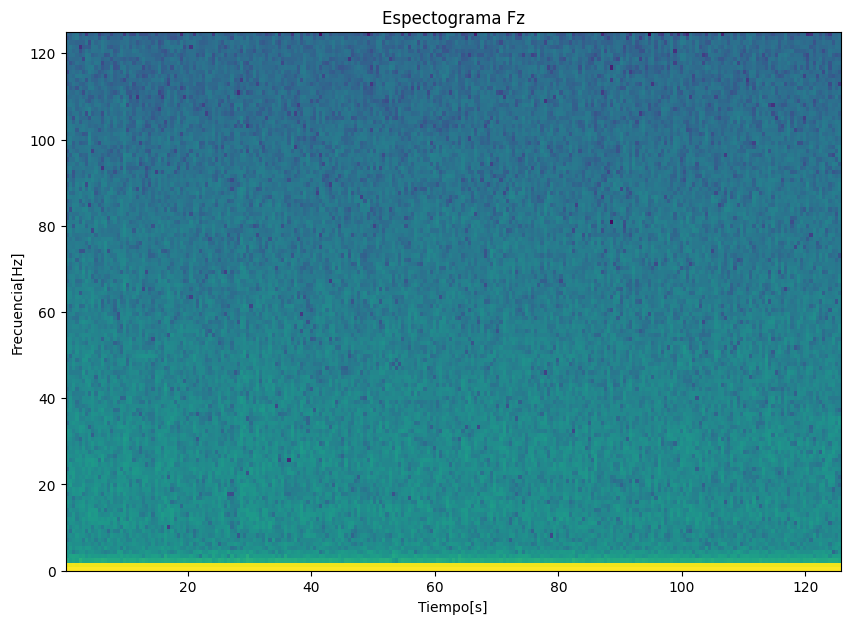

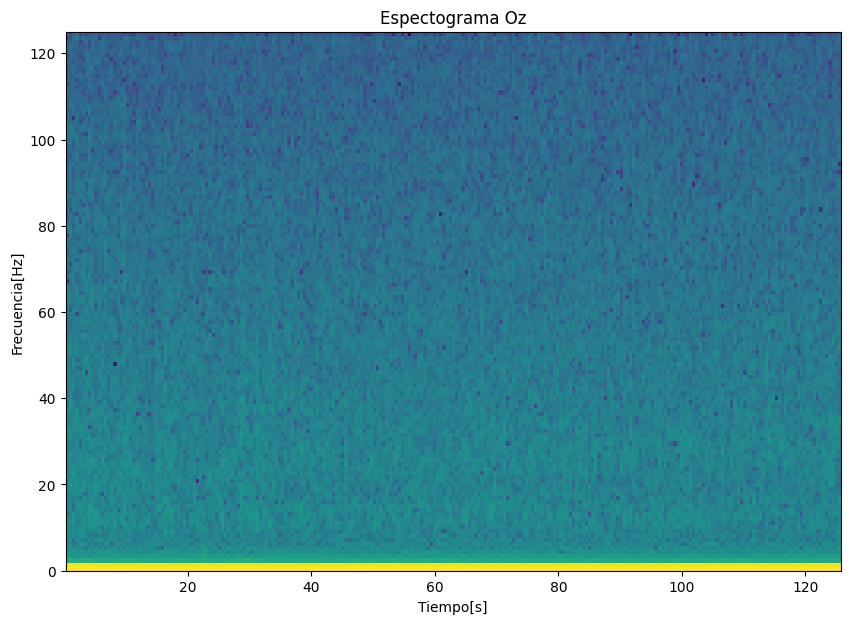

In [ ]:
espectrograma(datos2)

Paciente 1 - Ajedrez RyV

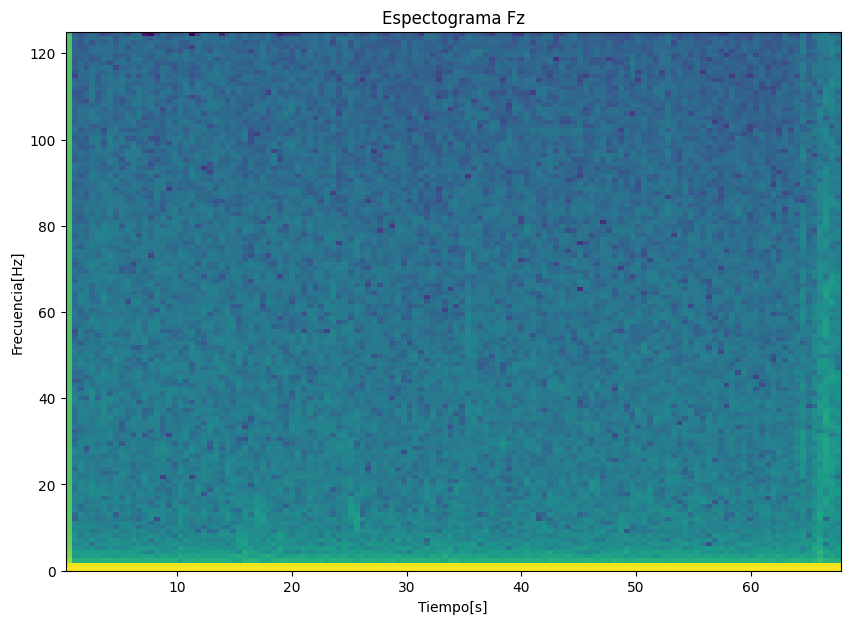

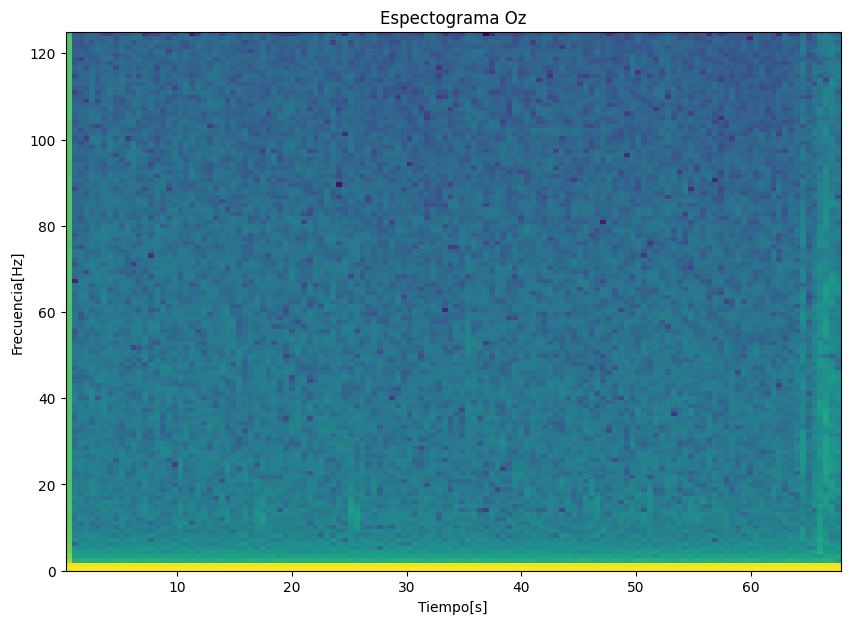

In [ ]:
espectrograma(datos3)

Paciente 1 - Flash

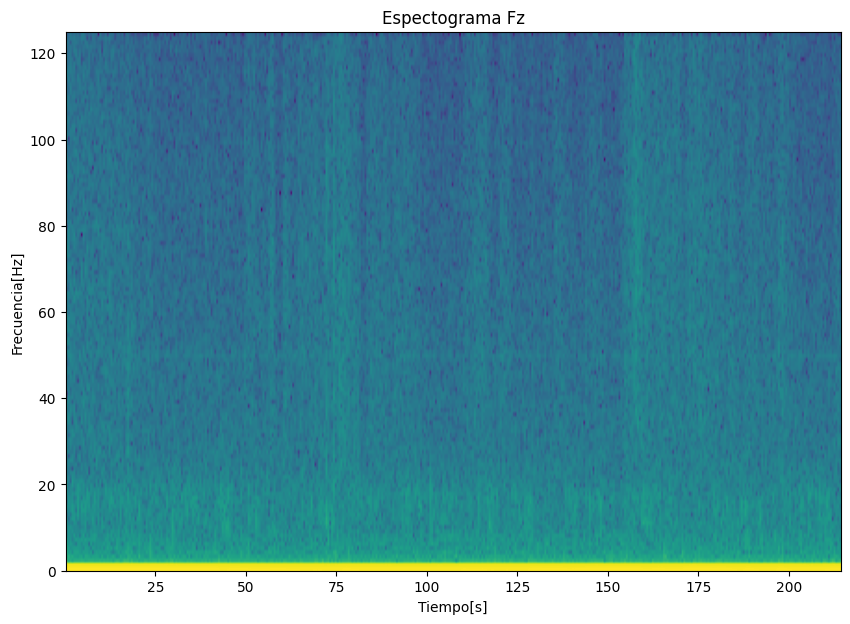

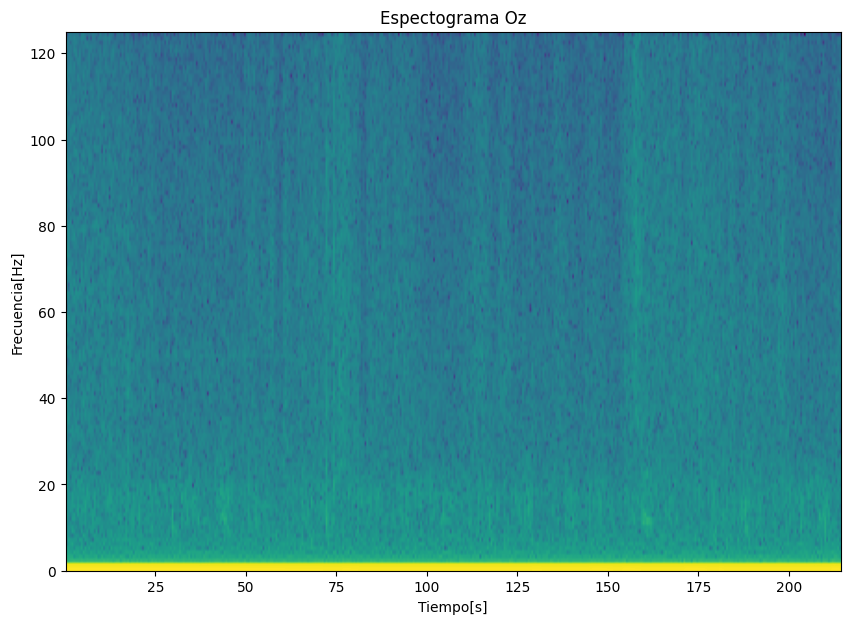

In [ ]:
espectrograma(flash1)

Paciente 2 - Flash

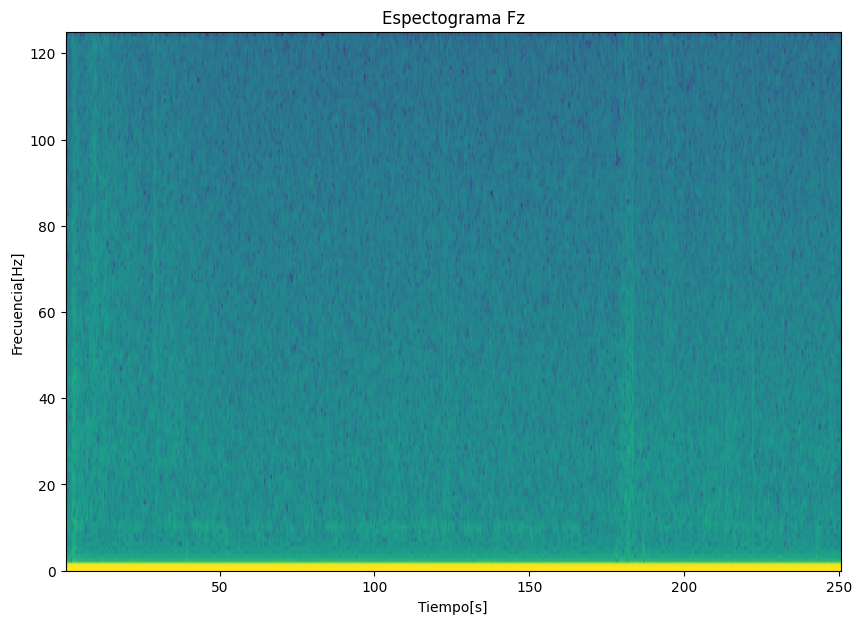

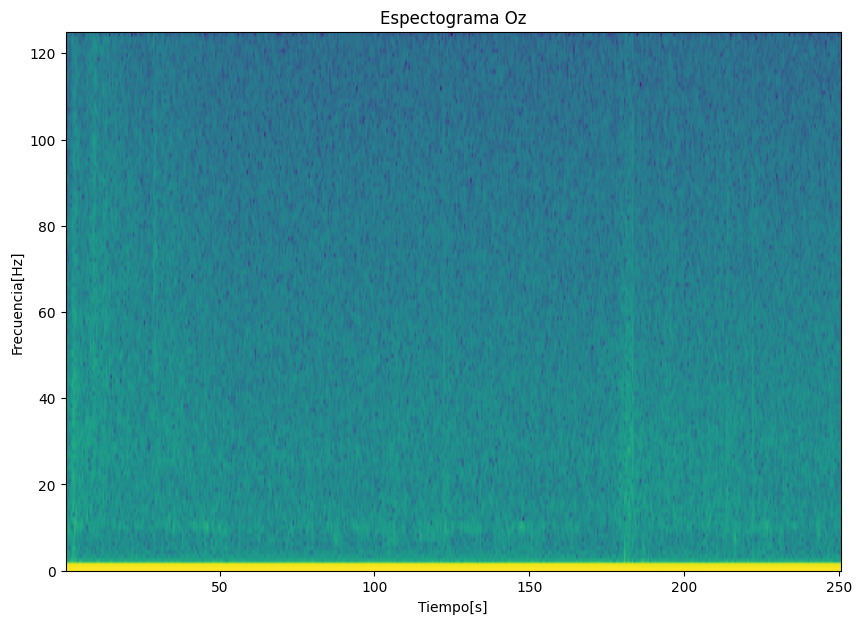

In [ ]:
espectrograma(flash2)

###4- Procesamiento

Se realizó una regresión lineal para filtrar los datos, en lugar de utilizar el filtro óptimo. Se comparan los resultados con los del filtro óptimo para el promedio homogéneo ordinario.

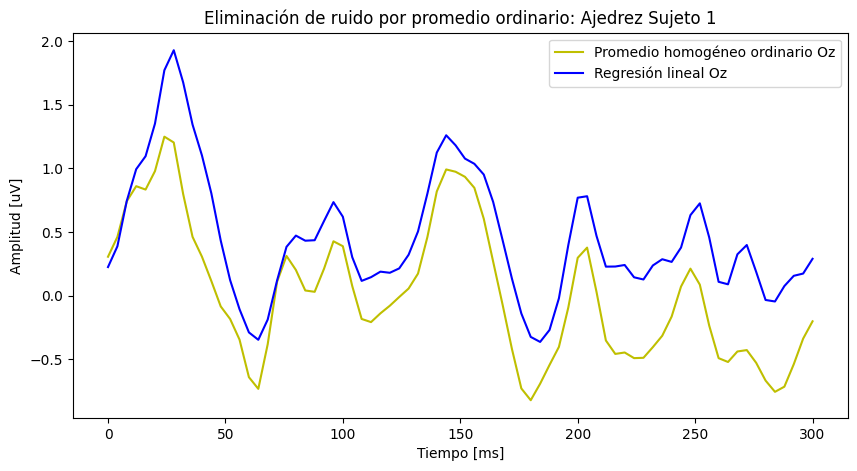

In [ ]:
regre1 = regresion_lineal(prom1,senales_chess['Oz_p1'])
pe_r1, _, _ = array_a_realizaciones(regre1,marcadores1)
prom1_r, _ = prom_homo(pe_r1)

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Oz1, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.plot(time_r, prom1_r, 'b', label = 'Regresión lineal Oz')
plt.title('Eliminación de ruido por promedio ordinario: Ajedrez Sujeto 1')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()

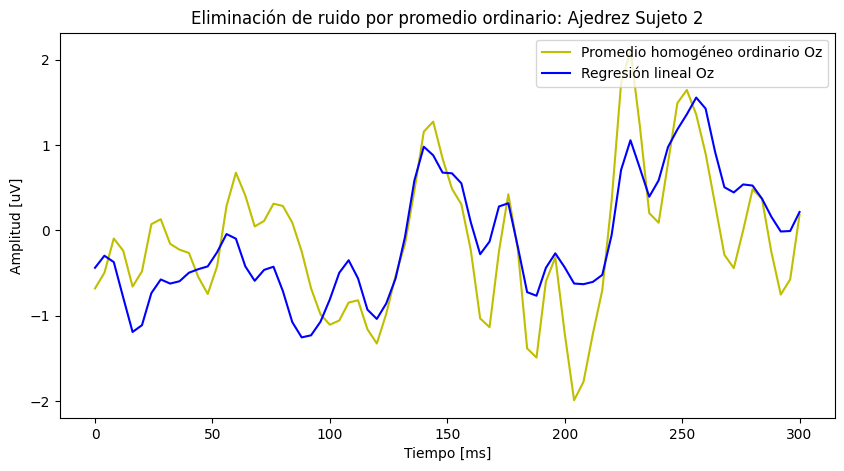

In [ ]:
regre2 = regresion_lineal(prom2,senales_chess['Oz_p2'])
pe_r2, _, _ = array_a_realizaciones(regre2,marcadores2)
prom2_r, _ = prom_homo(pe_r2)

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Oz2, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.plot(time_r, prom2_r, 'b', label = 'Regresión lineal Oz')
plt.title('Eliminación de ruido por promedio ordinario: Ajedrez Sujeto 2')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()

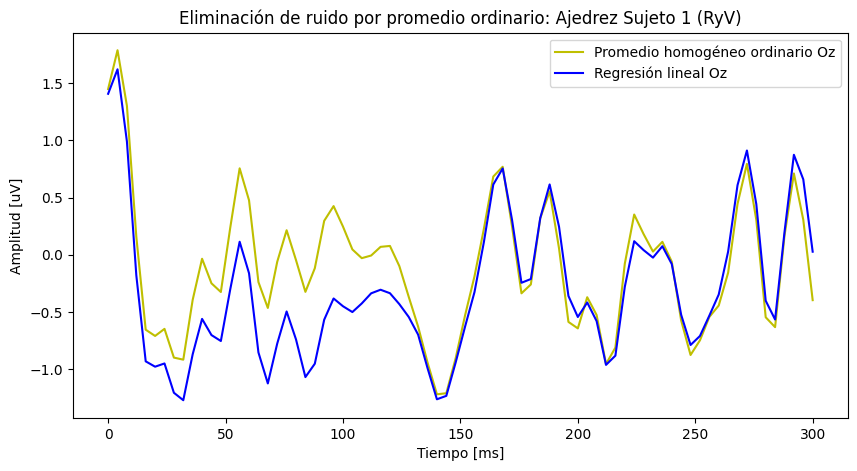

In [ ]:
regre3 = regresion_lineal(prom3,senales_chess['Oz_p3'])
pe_r3, _, _ = array_a_realizaciones(regre3,marcadores3)
prom3_r, _ = prom_homo(pe_r3)

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Oz3, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.plot(time_r, prom3_r, 'b', label = 'Regresión lineal Oz')
plt.title('Eliminación de ruido por promedio ordinario: Ajedrez Sujeto 1 (RyV)')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()

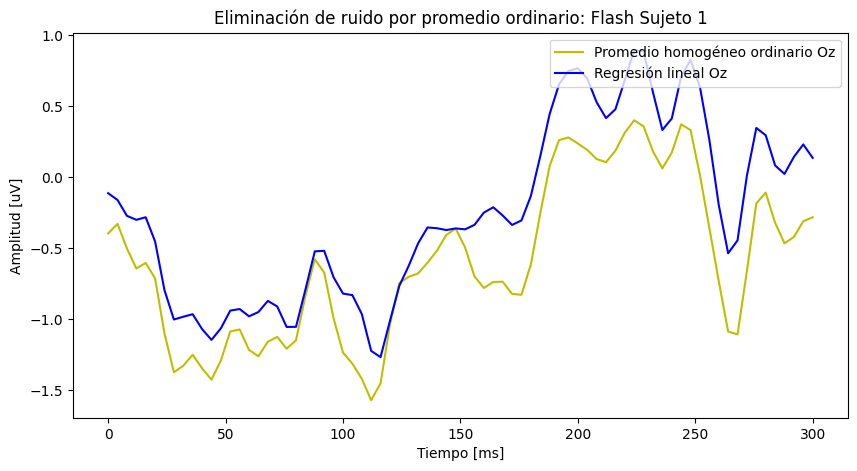

In [ ]:
regre1_f = regresion_lineal(prom1_f,senales_flash['Oz_p1'])
pe_r1_f, _, _ = array_a_realizaciones(regre1_f,marcadores1_f)
prom1_r_f, _ = prom_homo(pe_r1_f)

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Oz1_f, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.plot(time_r, prom1_r_f, 'b', label = 'Regresión lineal Oz')
plt.title('Eliminación de ruido por promedio ordinario: Flash Sujeto 1')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()

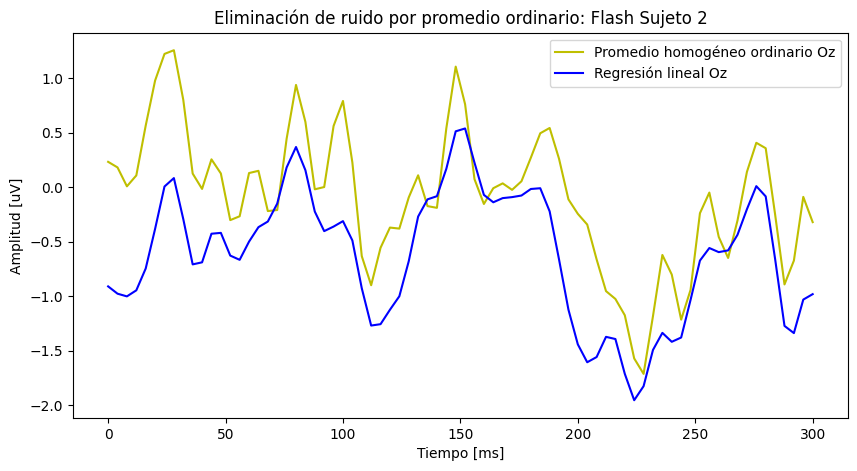

In [ ]:
regre2_f = regresion_lineal(prom2_f,senales_flash['Oz_p2'])
pe_r2_f, _, _ = array_a_realizaciones(regre2_f,marcadores2_f)
prom2_r_f, _ = prom_homo(pe_r2_f)

plt.figure(figsize=(10,5))
plt.plot(time_r, s_Oz2_f, 'y', label = 'Promedio homogéneo ordinario Oz')
plt.plot(time_r, prom2_r_f, 'b', label = 'Regresión lineal Oz')
plt.title('Eliminación de ruido por promedio ordinario: Flash Sujeto 2')
plt.ylabel('Amplitud [uV]')
plt.xlabel('Tiempo [ms]')
plt.legend(loc = 'upper right')
plt.show()